# Production forecasting

Unconventional wells are horizontal holes in the ground that bring a mixture of hydrocarbons and water to the surface. The location of the hole closest to the surface is given by the `novi_surface_hole_(latitude|longitude)` variables, and the end of the hole is given by `novi_bottom_hole_(latitude|longitude)`. Wells have to go down deep into the ground (to a distance of `novi_tvd` or True Vertical Depth) before they turn sideways and travel laterally -- the location where this happens is given by `novi_heel_(latitude|longitude)`. The part of the well that produces hydrocarbos is called the "lateral", and is the portion between the heel and the bottom hole, and has distance `novi_lateral_length`. 

To produce hydrocarbons, a mixture of sand (`novi_total_proppant`) and water (`novi_total_fluid`) is pumped into the lateral to fracture the surrounding rock -- this happens on `novi_frac_date`. The effectiveness of the fracturing process can depend on the natural grain orientation of the rock, which is not known. The orientation of the lateral is given by `novi_spacing_azimuth`. The fracturing process is completed before the well is "put on production", which is known as initial production (IP) day 1. The number of days that a well has been on production is given by `novi_ip_day`. Wells are sometimes taken off production for short amounts of time, so the production day may not increment at the same rate as the calendar day, which is given by `novi_date`.

Hydrocarbons are recovered from the area of rock surrounding the lateral, and so wells are drilled targeting specific rock deposition layers (`novi_formation`) known to be oil-bearing. The effectiveness of the well may depend on how much hydrocarbon was there to start (`novi_toc` Total Organic Content - estimated), as well as the capacity of the rock to hold fluid (`novi_porosity`) and the natural capacity of fluid to travel through the rock (`novi_permeability`) and estimates of the grain composition of the rock (`novi_vclay`).

The utimate recovery from a lateral can be affected by wells that are nearby, and this interference may be constructive (better fracturing) or destructive (competing for the same hydrocarbons). If there are no wells within 3,000ft, this well is a `novi_spacing_is_loner`. If there was an existing well on the same pad already on production when a second well is drilled, this second well is a `novi_spacing_is_child`. The total number of wells with 3,000ft of any given well is givenn by `novi_spacing_wells_in_radius`.

This dataset has been subsetted from the entire basin to only include two counties -- these are available in `novi_region`. Each well is given a standard, unique 14 digit number (an API number), which is given in `novi_unique_key`. Each well is managed by an incorporated entity, the names of which are given in `novi_current_operator`.

In this exercise, you'll be creating a model that is capable of forecasting a well's total cumulative oil production (`novi_oil`) at a given production day. Your model should take as input a vector of features indexed by API and IP day and produce an estimate of total oil recovered by that day. You should not spend more than 4 hours on thiis exercise.

In [415]:
import matplotlib.pyplot as plt
import numpy as np
import pandas as pd
import seaborn as sns

%matplotlib inline

plt.rcParams['figure.figsize'] = [12, 8]

In [416]:
features = pd.read_parquet('features.parquet',engine='auto')
features

novi_bottom_hole_latitude  \
novi_unique_key novi_ip_day                              
33061005990000  1                            48.012837   
                30                           48.012837   
                60                           48.012837   
                90                           48.012837   
                120                          48.012837   
...                                                ...   
33105053950000  90                           48.007990   
                120                          48.007990   
                150                          48.007990   
                180                          48.007990   
                210                          48.007990   

                             novi_bottom_hole_longitude novi_current_operator  \
novi_unique_key novi_ip_day                                                     
33061005990000  1                           -102.380303               Whiting   
                30                          -102.380303               Whiting   
                60                          -102.380303               Whiting   
                90                          -102.380303               Whiting   
                120                         -102.380303               Whiting   
...                                                 ...                   ...   
33105053950000  90                          -103.837793     Nine Point Energy   
                120                         -103.837793     Nine Point Energy   
                150                         -103.837793     Nine Point Energy   
                180                         -103.837793     Nine Point Energy   
                210                         -103.837793     Nine Point Energy   

                             novi_date novi_formation novi_frac_date  \
novi_unique_key novi_ip_day                                            
33061005990000  1           2008-06-13  Middle Bakken     2008-06-28   
                30          2008-07-27  Middle Bakken     2008-06-28   
                60          2008-08-26  Middle Bakken     2008-06-28   
                90          2008-09-25  Middle Bakken     2008-06-28   
                120         2008-10-25  Middle Bakken     2008-06-28   
...                                ...            ...            ...   
33105053950000  90          2021-03-31  Middle Bakken     1800-01-01   
                120         2021-04-30  Middle Bakken     1800-01-01   
                150         2021-05-30  Middle Bakken     1800-01-01   
                180         2021-06-29  Middle Bakken     1800-01-01   
                210         2021-07-29  Middle Bakken     1800-01-01   

                             novi_heel_latitude  novi_heel_longitude  \
novi_unique_key novi_ip_day                                            
33061005990000  1                      48.02116           -102.40436   
                30                     48.02116           -102.40436   
                60                     48.02116           -102.40436   
                90                     48.02116           -102.40436   
                120                    48.02116           -102.40436   
...                                         ...                  ...   
33105053950000  90                     48.00781           -103.87183   
                120                    48.00781           -103.87183   
                150                    48.00781           -103.87183   
                180                    48.00781           -103.87183   
                210                    48.00781           -103.87183   

                             novi_lateral_length  novi_net_thickness  \
novi_unique_key novi_ip_day                                            
33061005990000  1                    9297.666667           20.857313   
                30                   9297.666667           20.857313   
                60                   9297.666667          

In [417]:
targets = pd.read_parquet('targets.parquet')
targets

novi_oil
novi_unique_key novi_ip_day               
33061005990000  1              1179.000000
                30            25758.870968
                60            42765.580645
                90            55792.166667
                120           67145.806452
...                                    ...
33105053950000  90            39418.000000
                120           59764.000000
                150           79838.838710
                180           94405.766667
                210          111110.032258

[49534 rows x 1 columns]

In [418]:
features=pd.merge(features,targets, on=['novi_unique_key','novi_ip_day'])

In [419]:
pd.set_option('display.max_columns', 200)

features.describe()

,novi_bottom_hole_latitude,novi_bottom_hole_longitude,novi_heel_latitude,novi_heel_longitude,novi_lateral_length,novi_net_thickness,novi_permeability,novi_porosity,novi_spacing_azimuth,novi_spacing_is_child,novi_spacing_is_loner,novi_spacing_wells_in_radius,novi_surface_hole_latitude,novi_surface_hole_longitude,novi_toc,novi_toe_angle,novi_tortuosity,novi_total_fluid,novi_total_proppant,novi_tvd,novi_vclay,novi_oil
count,49534.000000,49534.000000,49343.000000,49341.000000,49384.000000,49410.000000,49220.000000,49343.000000,49304.000000,49484.000000,49247.0,49470.000000,49534.000000,49534.000000,49462.000000,49329.000000,49277.000000,49253.000000,4.925900e+04,49174.000000,49324.000000,49534.000000
mean,48.161871,-102.857557,48.165567,-102.857798,9135.275055,41.008686,0.065438,0.061624,-6.315240,0.945962,0.0,7.345886,48.165615,-102.857726,3.706207,0.149950,0.916892,132435.313085,6.376334e+06,10335.194494,0.180351,155322.139038
std,0.156007,0.472422,0.152927,0.471811,1435.018420,14.269949,0.047306,0.005209,36.724081,0.226094,0.0,2.730744,0.152762,0.472437,1.976846,3.023419,0.124025,87677.609751,4.064929e+06,548.553793,0.028523,92330.704989
min,47.790470,-103.987343,47.816070,-103.987350,3566.333333,15.126605,0.011000,0.048664,-89.929023,0.000000,0.0,0.000000,47.817000,-103.989200,0.015285,-1.367158,0.594315,0.000000,9.199320e+05,9085.656250,0.123551,1.100000
25%,48.068533,-103.277207,48.079510,-103.276710,8863.000000,29.276552,0.038575,0.057497,-23.300168,1.000000,0.0,6.000000,48.081400,-103.278920,2.292689,-0.308943,0.866322,55708.000000,3.250200e+06,9896.093750,0.162816,94056.936636
50%,48.167233,-102.708267,48.165690,-102.701270,9356.000000,38.774284,0.053149,0.062265,-1.750408,1.000000,0.0,7.000000,48.167720,-102.699660,3.467031,0.080128,0.997158,115022.238095,5.067977e+06,10431.373335,0.172915,144077.332949
75%,48.254553,-102.490100,48.251530,-102.487670,9770.333333,51.605208,0.073184,0.065092,-1.135566,1.000000,0.0,9.000000,48.253590,-102.484570,4.503541,0.382177,0.999120,195501.000000,8.895274e+06,10744.306122,0.193981,199570.181452
max,48.632670,-102.138750,48.607630,-102.119290,17334.333333,75.928591,0.322302,0.075016,89.376944,1.000000,0.0,18.000000,48.605410,-102.117670,11.879607,82.891793,1.000005,541214.000000,2.271827e+07,11391.800000,0.262732,766483.935484


In [420]:
features.columns

Index(['novi_bottom_hole_latitude', 'novi_bottom_hole_longitude',
       'novi_current_operator', 'novi_date', 'novi_formation',
       'novi_frac_date', 'novi_heel_latitude', 'novi_heel_longitude',
       'novi_lateral_length', 'novi_net_thickness', 'novi_permeability',
       'novi_porosity', 'novi_region', 'novi_spacing_azimuth',
       'novi_spacing_is_child', 'novi_spacing_is_loner',
       'novi_spacing_wells_in_radius', 'novi_surface_hole_latitude',
       'novi_surface_hole_longitude', 'novi_toc', 'novi_toe_angle',
       'novi_tortuosity', 'novi_total_fluid', 'novi_total_proppant',
       'novi_tvd', 'novi_vclay', 'novi_oil'],
      dtype='object')

In [421]:
from IPython.display import display

# three categorical features:
region,novi_current_operator, novi_formation  novi_date  

2 timestamp features

 3   novi_date                     49534 non-null  datetime64[ns]       
 5   novi_frac_date                49216 non-null  datetime64[ns]

these two date no important

In [422]:
features.info()

<class 'pandas.core.frame.DataFrame'>
MultiIndex: 49534 entries, ('33061005990000', 1) to ('33105053950000', 210)
Data columns (total 27 columns):
 #   Column                        Non-Null Count  Dtype         
---  ------                        --------------  -----         
 0   novi_bottom_hole_latitude     49534 non-null  float64       
 1   novi_bottom_hole_longitude    49534 non-null  float64       
 2   novi_current_operator         49395 non-null  object        
 3   novi_date                     49534 non-null  datetime64[ns]
 4   novi_formation                49252 non-null  object        
 5   novi_frac_date                49216 non-null  datetime64[ns]
 6   novi_heel_latitude            49343 non-null  float64       
 7   novi_heel_longitude           49341 non-null  float64       
 8   novi_lateral_length           49384 non-null  float64       
 9   novi_net_thickness            49410 non-null  float64       
 10  novi_permeability             49220 non-null  float64   

In [423]:
targets.info()

<class 'pandas.core.frame.DataFrame'>
MultiIndex: 49534 entries, ('33061005990000', 1) to ('33105053950000', 210)
Data columns (total 1 columns):
 #   Column    Non-Null Count  Dtype  
---  ------    --------------  -----  
 0   novi_oil  49534 non-null  float64
dtypes: float64(1)
memory usage: 627.3+ KB


In [424]:
features_pull=features.unstack()
features_pull

novi_bottom_hole_latitude                                   \
novi_ip_day                          1          30         60         90     
novi_unique_key                                                              
33061005990000                  48.012837  48.012837  48.012837  48.012837   
33061007120000                  47.998690  47.998690  47.998690  47.998690   
33061007560000                  48.008777  48.008777  48.008777  48.008777   
33061015420000                  48.350517  48.350517  48.350517  48.350517   
33061015870000                  48.283113  48.283113  48.283113  48.283113   
...                                   ...        ...        ...        ...   
33105053840000                  48.459130  48.459130  48.459130  48.459130   
33105053850000                  48.458657  48.458657  48.458657  48.458657   
33105053920000                  48.430260  48.430260        NaN        NaN   
33105053930000                  48.430250  48.430250        NaN        NaN   
33105053950000                  48.007990  48.007990  48.007990  48.007990   

                                                                        \
novi_ip_day           120        150        180        210        240    
novi_unique_key                                                          
33061005990000   48.012837  48.012837  48.012837  48.012837  48.012837   
33061007120000   47.998690  47.998690  47.998690  47.998690  47.998690   
33061007560000   48.008777  48.008777  48.008777  48.008777  48.008777   
33061015420000   48.350517  48.350517  48.350517  48.350517  48.350517   
33061015870000   48.283113  48.283113  48.283113  48.283113  48.283113   
...                    ...        ...        ...        ...        ...   
33105053840000   48.459130  48.459130        NaN        NaN        NaN   
33105053850000   48.458657  48.458657  48.458657  48.458657        NaN   
33105053920000         NaN        NaN        NaN        NaN        NaN   
33105053930000         NaN        NaN        NaN        NaN        NaN   
33105053950000   48.007990  48.007990  48.007990  48.007990        NaN   

                                                                        \
novi_ip_day           270        300        330        360        390    
novi_unique_key                                                          
33061005990000   48.012837  48.012837  48.012837  48.012837  48.012837   
33061007120000   47.998690  47.998690  47.998690  47.998690  47.998690   
33061007560000   48.008777  48.008777  48.008777  48.008777  48.008777   
33061015420000   48.350517  48.350517  48.350517  48.350517  48.350517   
33061015870000   48.283113  48.283113  48.283113  48.283113  48.283113   
...                    ...        ...        ...        ...        ...   
33105053840000         NaN        NaN        NaN        NaN        NaN   
33105053850000         NaN        NaN        NaN        NaN        NaN   
33105053920000         NaN        NaN        NaN        NaN        NaN   
33105053930000         NaN        NaN        NaN        NaN        NaN   
33105053950000         NaN        NaN        NaN        NaN        NaN   

                                                                        \
novi_ip_day           420        450        480        510        540    
novi_unique_key                                                          
33061005990000   48.012837  48.012837  48.012837  48.012837  48.012837   
33061007120000   47.998690  47.998690  47.998690  47.998690  47.998690   
33061007560000   48.008777  48.008777  48.008777  48.008777  48.008777   
33061015420000   48.350517  48.350517  48.350517  48.350517  48.350517   
33061015870000   48.283113  48.283113  48.283113  48.283113  48.283113   
...                    ...        ...        ...        ...        ...   
33105053840000         NaN        NaN        NaN        NaN        NaN   
33105053850000         NaN        NaN        NaN        NaN        NaN   
33105053920000         NaN        N

In [425]:
Features_flat=features.reset_index()  

In [426]:
#put all original data together

Features_flat

,novi_unique_key,novi_ip_day,novi_bottom_hole_latitude,novi_bottom_hole_longitude,novi_current_operator,novi_date,novi_formation,novi_frac_date,novi_heel_latitude,novi_heel_longitude,novi_lateral_length,novi_net_thickness,novi_permeability,novi_porosity,novi_region,novi_spacing_azimuth,novi_spacing_is_child,novi_spacing_is_loner,novi_spacing_wells_in_radius,novi_surface_hole_latitude,novi_surface_hole_longitude,novi_toc,novi_toe_angle,novi_tortuosity,novi_total_fluid,novi_total_proppant,novi_tvd,novi_vclay,novi_oil
0,33061005990000,1,48.012837,-102.380303,Whiting,2008-06-13,Middle Bakken,2008-06-28,48.02116,-102.40436,9297.666667,20.857313,0.016807,0.053066,Mountrail,-64.659417,1.0,0.0,2.0,48.02246,-102.40635,2.615370,-0.781249,0.712625,0.000000,1840000.0,9956.671233,0.168064,1179.000000
1,33061005990000,30,48.012837,-102.380303,Whiting,2008-07-27,Middle Bakken,2008-06-28,48.02116,-102.40436,9297.666667,20.857313,0.016807,0.053066,Mountrail,-64.659417,1.0,0.0,2.0,48.02246,-102.40635,2.615370,-0.781249,0.712625,0.000000,1840000.0,9956.671233,0.168064,25758.870968
2,33061005990000,60,48.012837,-102.380303,Whiting,2008-08-26,Middle Bakken,2008-06-28,48.02116,-102.40436,9297.666667,20.857313,0.016807,0.053066,Mountrail,-64.659417,1.0,0.0,2.0,48.02246,-102.40635,2.615370,-0.781249,0.712625,0.000000,1840000.0,9956.671233,0.168064,42765.580645
3,33061005990000,90,48.012837,-102.380303,Whiting,2008-09-25,Middle Bakken,2008-06-28,48.02116,-102.40436,9297.666667,20.857313,0.016807,0.053066,Mountrail,-64.659417,1.0,0.0,2.0,48.02246,-102.40635,2.615370,-0.781249,0.712625,0.000000,1840000.0,9956.671233,0.168064,55792.166667
4,33061005990000,120,48.012837,-102.380303,Whiting,2008-10-25,Middle Bakken,2008-06-28,48.02116,-102.40436,9297.666667,20.857313,0.016807,0.053066,Mountrail,-64.659417,1.0,0.0,2.0,48.02246,-102.40635,2.615370,-0.781249,0.712625,0.000000,1840000.0,9956.671233,0.168064,67145.806452
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
49529,33105053950000,90,48.007990,-103.837793,Nine Point Energy,2021-03-31,Middle Bakken,1800-01-01,48.00781,-103.87183,12423.000000,17.423451,0.084485,0.063256,Williams,88.697271,1.0,0.0,5.0,48.01421,-103.87551,3.053981,0.185720,0.670507,231479.833333,11833155.0,10396.521739,0.176241,39418.000000
49530,33105053950000,120,48.007990,-103.837793,Nine Point Energy,2021-04-30,Middle Bakken,1800-01-01,48.00781,-103.87183,12423.000000,17.423451,0.084485,0.063256,Williams,88.697271,1.0,0.0,5.0,48.01421,-103.87551,3.053981,0.185720,0.670507,231479.833333,11833155.0,10396.521739,0.176241,59764.000000
49531,33105053950000,150,48.007990,-103.837793,Nine Point Energy,2021-05-30,Middle Bakken,1800-01-01,48.00781,-103.87183,12423.000000,17.423451,0.084485,0.063256,Williams,88.697271,1.0,0.0,5.0,48.01421,-103.87551,3.053981,0.185720,0.670507,231479.833333,11833155.0,10396.521739,0.176241,79838.838710
49532,33105053950000,180,48.007990,-103.837793,Nine Point Energy,2021-06-29,Middle Bakken,1800-01-01,48.00781,-103.87183,12423.000000,17.423451,0.084485,0.063256,Williams,88.697271,1.0,0.0,5.0,48.01421,-103.87551,3.053981,0.185720,0.670507,231479.833333,11833155.0,10396.521739,0.176241,94405.766667


In [427]:
Features_flat.describe()

,novi_ip_day,novi_bottom_hole_latitude,novi_bottom_hole_longitude,novi_heel_latitude,novi_heel_longitude,novi_lateral_length,novi_net_thickness,novi_permeability,novi_porosity,novi_spacing_azimuth,novi_spacing_is_child,novi_spacing_is_loner,novi_spacing_wells_in_radius,novi_surface_hole_latitude,novi_surface_hole_longitude,novi_toc,novi_toe_angle,novi_tortuosity,novi_total_fluid,novi_total_proppant,novi_tvd,novi_vclay,novi_oil
count,49534.000000,49534.000000,49534.000000,49343.000000,49341.000000,49384.000000,49410.000000,49220.000000,49343.000000,49304.000000,49484.000000,49247.0,49470.000000,49534.000000,49534.000000,49462.000000,49329.000000,49277.000000,49253.000000,4.925900e+04,49174.000000,49324.000000,49534.000000
mean,873.362014,48.161871,-102.857557,48.165567,-102.857798,9135.275055,41.008686,0.065438,0.061624,-6.315240,0.945962,0.0,7.345886,48.165615,-102.857726,3.706207,0.149950,0.916892,132435.313085,6.376334e+06,10335.194494,0.180351,155322.139038
std,676.910260,0.156007,0.472422,0.152927,0.471811,1435.018420,14.269949,0.047306,0.005209,36.724081,0.226094,0.0,2.730744,0.152762,0.472437,1.976846,3.023419,0.124025,87677.609751,4.064929e+06,548.553793,0.028523,92330.704989
min,1.000000,47.790470,-103.987343,47.816070,-103.987350,3566.333333,15.126605,0.011000,0.048664,-89.929023,0.000000,0.0,0.000000,47.817000,-103.989200,0.015285,-1.367158,0.594315,0.000000,9.199320e+05,9085.656250,0.123551,1.100000
25%,330.000000,48.068533,-103.277207,48.079510,-103.276710,8863.000000,29.276552,0.038575,0.057497,-23.300168,1.000000,0.0,6.000000,48.081400,-103.278920,2.292689,-0.308943,0.866322,55708.000000,3.250200e+06,9896.093750,0.162816,94056.936636
50%,720.000000,48.167233,-102.708267,48.165690,-102.701270,9356.000000,38.774284,0.053149,0.062265,-1.750408,1.000000,0.0,7.000000,48.167720,-102.699660,3.467031,0.080128,0.997158,115022.238095,5.067977e+06,10431.373335,0.172915,144077.332949
75%,1320.000000,48.254553,-102.490100,48.251530,-102.487670,9770.333333,51.605208,0.073184,0.065092,-1.135566,1.000000,0.0,9.000000,48.253590,-102.484570,4.503541,0.382177,0.999120,195501.000000,8.895274e+06,10744.306122,0.193981,199570.181452
max,4560.000000,48.632670,-102.138750,48.607630,-102.119290,17334.333333,75.928591,0.322302,0.075016,89.376944,1.000000,0.0,18.000000,48.605410,-102.117670,11.879607,82.891793,1.000005,541214.000000,2.271827e+07,11391.800000,0.262732,766483.935484


In [428]:
Features_flat.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 49534 entries, 0 to 49533
Data columns (total 29 columns):
 #   Column                        Non-Null Count  Dtype         
---  ------                        --------------  -----         
 0   novi_unique_key               49534 non-null  object        
 1   novi_ip_day                   49534 non-null  int64         
 2   novi_bottom_hole_latitude     49534 non-null  float64       
 3   novi_bottom_hole_longitude    49534 non-null  float64       
 4   novi_current_operator         49395 non-null  object        
 5   novi_date                     49534 non-null  datetime64[ns]
 6   novi_formation                49252 non-null  object        
 7   novi_frac_date                49216 non-null  datetime64[ns]
 8   novi_heel_latitude            49343 non-null  float64       
 9   novi_heel_longitude           49341 non-null  float64       
 10  novi_lateral_length           49384 non-null  float64       
 11  novi_net_thickness          

In [429]:
len(Features_flat['novi_unique_key'].unique().tolist())

1174

In [430]:
print('total well number in original dataset is {}'.format(len(Features_flat['novi_unique_key'].unique().tolist())))

total well number in original dataset is 1174


# 1. Dataset EDA

 #    feature analysis        
---------------------------------------------------------------------------------              
 0   novi_unique_key               49534 non-null  object        
 1   novi_ip_day                   49534 non-null  int64 
 
Time parameters: **not important**

 5   novi_date                     49534 non-null  datetime64[ns]
 7   novi_frac_date                49216 non-null  datetime64[ns]


    
**Geology parameters:**
 14  novi_region                   49241 non-null  object
 6   novi_formation                49252 non-null  object  
 
     
        
 11  novi_net_thickness            49410 non-null  float64       
 12  novi_permeability             49220 non-null  float64       
 13  novi_porosity                 49343 non-null  float64 


**Reservoir property parameters:**

 21  novi_toc                      49462 non-null  float64 
 22  novi_toe_angle                49329 non-null  float64       
 23  novi_tortuosity               49277 non-null  float64       
        
 26  novi_tvd                      49174 non-null  float64       
 27  novi_vclay                    49324 non-null  float64 


**Production and completion parameters:**
    
 4   novi_current_operator         49395 non-null  object
 
 24  novi_total_fluid              49253 non-null  float64       
 25  novi_total_proppant           49259 non-null  float64
 
 
 2   novi_bottom_hole_latitude     49534 non-null  float64       
 3   novi_bottom_hole_longitude    49534 non-null  float64        
         
 8   novi_heel_latitude            49343 non-null  float64       
 9   novi_heel_longitude           49341 non-null  float64       
 10  novi_lateral_length           49384 non-null  float64
         
 15  novi_spacing_azimuth          49304 non-null  float64       
 16  novi_spacing_is_child         49484 non-null  float64       
 17  novi_spacing_is_loner         49247 non-null  float64       
 18  novi_spacing_wells_in_radius  49470 non-null  float64       
 19  novi_surface_hole_latitude    49534 non-null  float64       
 20  novi_surface_hole_longitude   49534 non-null  float64  
    
**nearlly all features have some amount of null values  <1%**    
 

**region null list**

In [431]:
Features_flat['novi_region'].unique().tolist()

['Mountrail', None, 'Williams']

In [432]:
Region_null=Features_flat[Features_flat['novi_region'].isnull()]
Region_null
region_list=Region_null['novi_unique_key'].unique().tolist()
region_list

['33061022030000',
 '33061029500000',
 '33061033040000',
 '33061033140000',
 '33105031890000']

**formation null list**

In [433]:
formation_null=Features_flat[Features_flat['novi_formation'].isnull()]
formation_list=formation_null['novi_unique_key'].unique().tolist()
formation_list

['33061021560000',
 '33061040430000',
 '33061040820000',
 '33105032620000',
 '33105040740000',
 '33105049050000']

In [434]:
Features_flat['novi_formation'].unique().tolist()

['Middle Bakken', 'Three Forks', None]

**operator null list**

In [435]:
Features_flat['novi_current_operator'].unique().tolist()

['Whiting',
 'EOG',
 'Hess',
 'Slawson',
 'Marathon',
 'Grayson Mill Energy',
 'Devon Energy',
 'Lime Rock III',
 'Murex Petroleum',
 'Kraken Operating',
 'Exxon Mobil',
 'Oasis',
 'Petrogulf Corporation',
 'Continental Resources',
 None,
 'Sinclair',
 'Liberty Resources',
 'Zavanna',
 'Enerplus',
 'Nine Point Energy',
 'Crescent Point Energy']

In [436]:
operator_null=Features_flat[Features_flat['novi_current_operator'].isnull()]
operator_list=operator_null['novi_unique_key'].unique().tolist()
operator_list

['33061027620000', '33105041120000', '33105050050000']

In [437]:
operator_list+formation_list+region_list

['33061027620000',
 '33105041120000',
 '33105050050000',
 '33061021560000',
 '33061040430000',
 '33061040820000',
 '33105032620000',
 '33105040740000',
 '33105049050000',
 '33061022030000',
 '33061029500000',
 '33061033040000',
 '33061033140000',
 '33105031890000']

**removel all the rows with three categorical features are null**

In [438]:
Features_middle=Features_flat.drop(Features_flat[Features_flat['novi_unique_key'].isin(set(operator_list+formation_list+region_list))].index)

In [439]:
Features_middle=Features_middle.drop(columns=['novi_date','novi_frac_date'])
Features_middle

,novi_unique_key,novi_ip_day,novi_bottom_hole_latitude,novi_bottom_hole_longitude,novi_current_operator,novi_formation,novi_heel_latitude,novi_heel_longitude,novi_lateral_length,novi_net_thickness,novi_permeability,novi_porosity,novi_region,novi_spacing_azimuth,novi_spacing_is_child,novi_spacing_is_loner,novi_spacing_wells_in_radius,novi_surface_hole_latitude,novi_surface_hole_longitude,novi_toc,novi_toe_angle,novi_tortuosity,novi_total_fluid,novi_total_proppant,novi_tvd,novi_vclay,novi_oil
0,33061005990000,1,48.012837,-102.380303,Whiting,Middle Bakken,48.02116,-102.40436,9297.666667,20.857313,0.016807,0.053066,Mountrail,-64.659417,1.0,0.0,2.0,48.02246,-102.40635,2.615370,-0.781249,0.712625,0.000000,1840000.0,9956.671233,0.168064,1179.000000
1,33061005990000,30,48.012837,-102.380303,Whiting,Middle Bakken,48.02116,-102.40436,9297.666667,20.857313,0.016807,0.053066,Mountrail,-64.659417,1.0,0.0,2.0,48.02246,-102.40635,2.615370,-0.781249,0.712625,0.000000,1840000.0,9956.671233,0.168064,25758.870968
2,33061005990000,60,48.012837,-102.380303,Whiting,Middle Bakken,48.02116,-102.40436,9297.666667,20.857313,0.016807,0.053066,Mountrail,-64.659417,1.0,0.0,2.0,48.02246,-102.40635,2.615370,-0.781249,0.712625,0.000000,1840000.0,9956.671233,0.168064,42765.580645
3,33061005990000,90,48.012837,-102.380303,Whiting,Middle Bakken,48.02116,-102.40436,9297.666667,20.857313,0.016807,0.053066,Mountrail,-64.659417,1.0,0.0,2.0,48.02246,-102.40635,2.615370,-0.781249,0.712625,0.000000,1840000.0,9956.671233,0.168064,55792.166667
4,33061005990000,120,48.012837,-102.380303,Whiting,Middle Bakken,48.02116,-102.40436,9297.666667,20.857313,0.016807,0.053066,Mountrail,-64.659417,1.0,0.0,2.0,48.02246,-102.40635,2.615370,-0.781249,0.712625,0.000000,1840000.0,9956.671233,0.168064,67145.806452
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
49529,33105053950000,90,48.007990,-103.837793,Nine Point Energy,Middle Bakken,48.00781,-103.87183,12423.000000,17.423451,0.084485,0.063256,Williams,88.697271,1.0,0.0,5.0,48.01421,-103.87551,3.053981,0.185720,0.670507,231479.833333,11833155.0,10396.521739,0.176241,39418.000000
49530,33105053950000,120,48.007990,-103.837793,Nine Point Energy,Middle Bakken,48.00781,-103.87183,12423.000000,17.423451,0.084485,0.063256,Williams,88.697271,1.0,0.0,5.0,48.01421,-103.87551,3.053981,0.185720,0.670507,231479.833333,11833155.0,10396.521739,0.176241,59764.000000
49531,33105053950000,150,48.007990,-103.837793,Nine Point Energy,Middle Bakken,48.00781,-103.87183,12423.000000,17.423451,0.084485,0.063256,Williams,88.697271,1.0,0.0,5.0,48.01421,-103.87551,3.053981,0.185720,0.670507,231479.833333,11833155.0,10396.521739,0.176241,79838.838710
49532,33105053950000,180,48.007990,-103.837793,Nine Point Energy,Middle Bakken,48.00781,-103.87183,12423.000000,17.423451,0.084485,0.063256,Williams,88.697271,1.0,0.0,5.0,48.01421,-103.87551,3.053981,0.185720,0.670507,231479.833333,11833155.0,10396.521739,0.176241,94405.766667


In [440]:
Features_middle.info()

<class 'pandas.core.frame.DataFrame'>
Int64Index: 48820 entries, 0 to 49533
Data columns (total 27 columns):
 #   Column                        Non-Null Count  Dtype  
---  ------                        --------------  -----  
 0   novi_unique_key               48820 non-null  object 
 1   novi_ip_day                   48820 non-null  int64  
 2   novi_bottom_hole_latitude     48820 non-null  float64
 3   novi_bottom_hole_longitude    48820 non-null  float64
 4   novi_current_operator         48820 non-null  object 
 5   novi_formation                48820 non-null  object 
 6   novi_heel_latitude            48629 non-null  float64
 7   novi_heel_longitude           48627 non-null  float64
 8   novi_lateral_length           48670 non-null  float64
 9   novi_net_thickness            48696 non-null  float64
 10  novi_permeability             48506 non-null  float64
 11  novi_porosity                 48629 non-null  float64
 12  novi_region                   48820 non-null  object 
 13  n

In [441]:
### deal with numerical features

Features_middle.dropna(inplace=True)
Features_middle

,novi_unique_key,novi_ip_day,novi_bottom_hole_latitude,novi_bottom_hole_longitude,novi_current_operator,novi_formation,novi_heel_latitude,novi_heel_longitude,novi_lateral_length,novi_net_thickness,novi_permeability,novi_porosity,novi_region,novi_spacing_azimuth,novi_spacing_is_child,novi_spacing_is_loner,novi_spacing_wells_in_radius,novi_surface_hole_latitude,novi_surface_hole_longitude,novi_toc,novi_toe_angle,novi_tortuosity,novi_total_fluid,novi_total_proppant,novi_tvd,novi_vclay,novi_oil
0,33061005990000,1,48.012837,-102.380303,Whiting,Middle Bakken,48.02116,-102.40436,9297.666667,20.857313,0.016807,0.053066,Mountrail,-64.659417,1.0,0.0,2.0,48.02246,-102.40635,2.615370,-0.781249,0.712625,0.000000,1840000.0,9956.671233,0.168064,1179.000000
1,33061005990000,30,48.012837,-102.380303,Whiting,Middle Bakken,48.02116,-102.40436,9297.666667,20.857313,0.016807,0.053066,Mountrail,-64.659417,1.0,0.0,2.0,48.02246,-102.40635,2.615370,-0.781249,0.712625,0.000000,1840000.0,9956.671233,0.168064,25758.870968
2,33061005990000,60,48.012837,-102.380303,Whiting,Middle Bakken,48.02116,-102.40436,9297.666667,20.857313,0.016807,0.053066,Mountrail,-64.659417,1.0,0.0,2.0,48.02246,-102.40635,2.615370,-0.781249,0.712625,0.000000,1840000.0,9956.671233,0.168064,42765.580645
3,33061005990000,90,48.012837,-102.380303,Whiting,Middle Bakken,48.02116,-102.40436,9297.666667,20.857313,0.016807,0.053066,Mountrail,-64.659417,1.0,0.0,2.0,48.02246,-102.40635,2.615370,-0.781249,0.712625,0.000000,1840000.0,9956.671233,0.168064,55792.166667
4,33061005990000,120,48.012837,-102.380303,Whiting,Middle Bakken,48.02116,-102.40436,9297.666667,20.857313,0.016807,0.053066,Mountrail,-64.659417,1.0,0.0,2.0,48.02246,-102.40635,2.615370,-0.781249,0.712625,0.000000,1840000.0,9956.671233,0.168064,67145.806452
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
49529,33105053950000,90,48.007990,-103.837793,Nine Point Energy,Middle Bakken,48.00781,-103.87183,12423.000000,17.423451,0.084485,0.063256,Williams,88.697271,1.0,0.0,5.0,48.01421,-103.87551,3.053981,0.185720,0.670507,231479.833333,11833155.0,10396.521739,0.176241,39418.000000
49530,33105053950000,120,48.007990,-103.837793,Nine Point Energy,Middle Bakken,48.00781,-103.87183,12423.000000,17.423451,0.084485,0.063256,Williams,88.697271,1.0,0.0,5.0,48.01421,-103.87551,3.053981,0.185720,0.670507,231479.833333,11833155.0,10396.521739,0.176241,59764.000000
49531,33105053950000,150,48.007990,-103.837793,Nine Point Energy,Middle Bakken,48.00781,-103.87183,12423.000000,17.423451,0.084485,0.063256,Williams,88.697271,1.0,0.0,5.0,48.01421,-103.87551,3.053981,0.185720,0.670507,231479.833333,11833155.0,10396.521739,0.176241,79838.838710
49532,33105053950000,180,48.007990,-103.837793,Nine Point Energy,Middle Bakken,48.00781,-103.87183,12423.000000,17.423451,0.084485,0.063256,Williams,88.697271,1.0,0.0,5.0,48.01421,-103.87551,3.053981,0.185720,0.670507,231479.833333,11833155.0,10396.521739,0.176241,94405.766667


In [442]:
Features_middle.info()

<class 'pandas.core.frame.DataFrame'>
Int64Index: 45426 entries, 0 to 49533
Data columns (total 27 columns):
 #   Column                        Non-Null Count  Dtype  
---  ------                        --------------  -----  
 0   novi_unique_key               45426 non-null  object 
 1   novi_ip_day                   45426 non-null  int64  
 2   novi_bottom_hole_latitude     45426 non-null  float64
 3   novi_bottom_hole_longitude    45426 non-null  float64
 4   novi_current_operator         45426 non-null  object 
 5   novi_formation                45426 non-null  object 
 6   novi_heel_latitude            45426 non-null  float64
 7   novi_heel_longitude           45426 non-null  float64
 8   novi_lateral_length           45426 non-null  float64
 9   novi_net_thickness            45426 non-null  float64
 10  novi_permeability             45426 non-null  float64
 11  novi_porosity                 45426 non-null  float64
 12  novi_region                   45426 non-null  object 
 13  n

In [443]:
len(Features_middle['novi_unique_key'].unique().tolist())

1082

**the following numerical feature could be imputed by domain knowledge, need lots of detail** 

In [444]:
Features_middle.describe()

,novi_ip_day,novi_bottom_hole_latitude,novi_bottom_hole_longitude,novi_heel_latitude,novi_heel_longitude,novi_lateral_length,novi_net_thickness,novi_permeability,novi_porosity,novi_spacing_azimuth,novi_spacing_is_child,novi_spacing_is_loner,novi_spacing_wells_in_radius,novi_surface_hole_latitude,novi_surface_hole_longitude,novi_toc,novi_toe_angle,novi_tortuosity,novi_total_fluid,novi_total_proppant,novi_tvd,novi_vclay,novi_oil
count,45426.000000,45426.000000,45426.000000,45426.000000,45426.000000,45426.000000,45426.000000,45426.000000,45426.000000,45426.000000,45426.000000,45426.0,45426.000000,45426.000000,45426.000000,45426.000000,45426.000000,45426.000000,45426.000000,4.542600e+04,45426.000000,45426.000000,45426.000000
mean,872.771805,48.163479,-102.860571,48.166779,-102.860804,9144.195850,40.934983,0.065424,0.061587,-6.335346,0.943248,0.0,7.282613,48.167179,-102.860838,3.735859,0.155236,0.914491,132116.062485,6.386751e+06,10330.518092,0.180529,155248.093765
std,678.132797,0.157225,0.474821,0.154290,0.474722,1429.826001,14.212744,0.047551,0.005181,37.570194,0.231370,0.0,2.709797,0.154087,0.474776,1.989083,3.148141,0.125475,88438.361807,4.085477e+06,546.472897,0.028627,93361.062286
min,1.000000,47.790470,-103.987343,47.816070,-103.987350,3566.333333,15.126605,0.011000,0.048664,-89.929023,0.000000,0.0,0.000000,47.817000,-103.989200,0.015285,-1.367158,0.657766,0.000000,9.199320e+05,9085.656250,0.123551,1.100000
25%,330.000000,48.071293,-103.280457,48.079510,-103.277740,8890.666667,29.030233,0.038471,0.057467,-23.375641,1.000000,0.0,5.000000,48.081490,-103.279140,2.309641,-0.314244,0.860480,55048.000000,3.229839e+06,9892.781818,0.162748,93108.642857
50%,720.000000,48.167233,-102.708267,48.165680,-102.701270,9356.000000,38.745712,0.053352,0.062318,-1.734822,1.000000,0.0,7.000000,48.167720,-102.699660,3.485066,0.074439,0.997035,112631.000000,5.090890e+06,10423.711111,0.172945,143516.456618
75%,1320.000000,48.254620,-102.489710,48.251880,-102.482570,9774.666667,51.892635,0.073456,0.065082,-1.114967,1.000000,0.0,9.000000,48.253770,-102.481720,4.506137,0.387463,0.999120,195515.000000,8.895274e+06,10739.426230,0.194110,199577.883333
max,4560.000000,48.632670,-102.138750,48.607630,-102.119290,17334.333333,75.928591,0.322302,0.075000,89.376944,1.000000,0.0,18.000000,48.605410,-102.117670,11.879607,82.891793,1.000005,541214.000000,2.271827e+07,11391.800000,0.262732,766483.935484


**['novi_spacing_is_loner'] all are 0, so remove this column**

In [445]:
Features_middle.drop(columns='novi_spacing_is_loner',inplace=True)  ##

<AxesSubplot:>

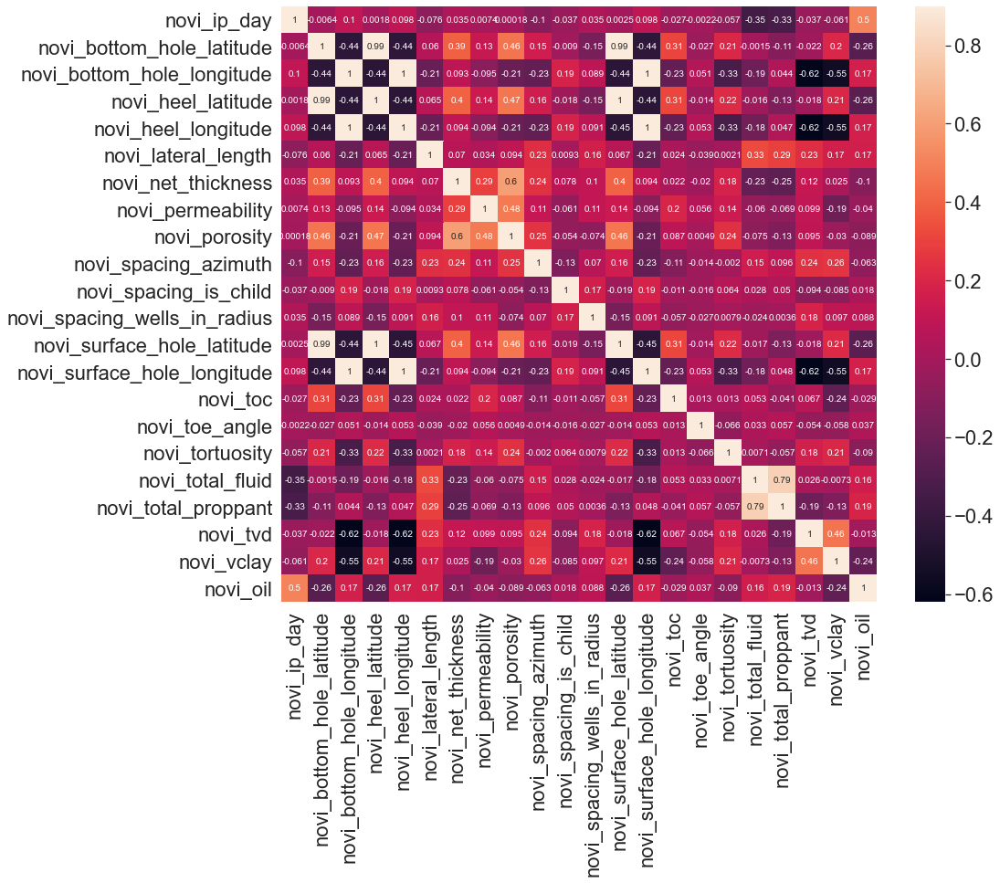

In [446]:
corrmat = Features_middle.corr()
plt.subplots(figsize=(15,12))
sns.heatmap(corrmat, vmax=0.9, square=True,annot=True) 

<AxesSubplot:>

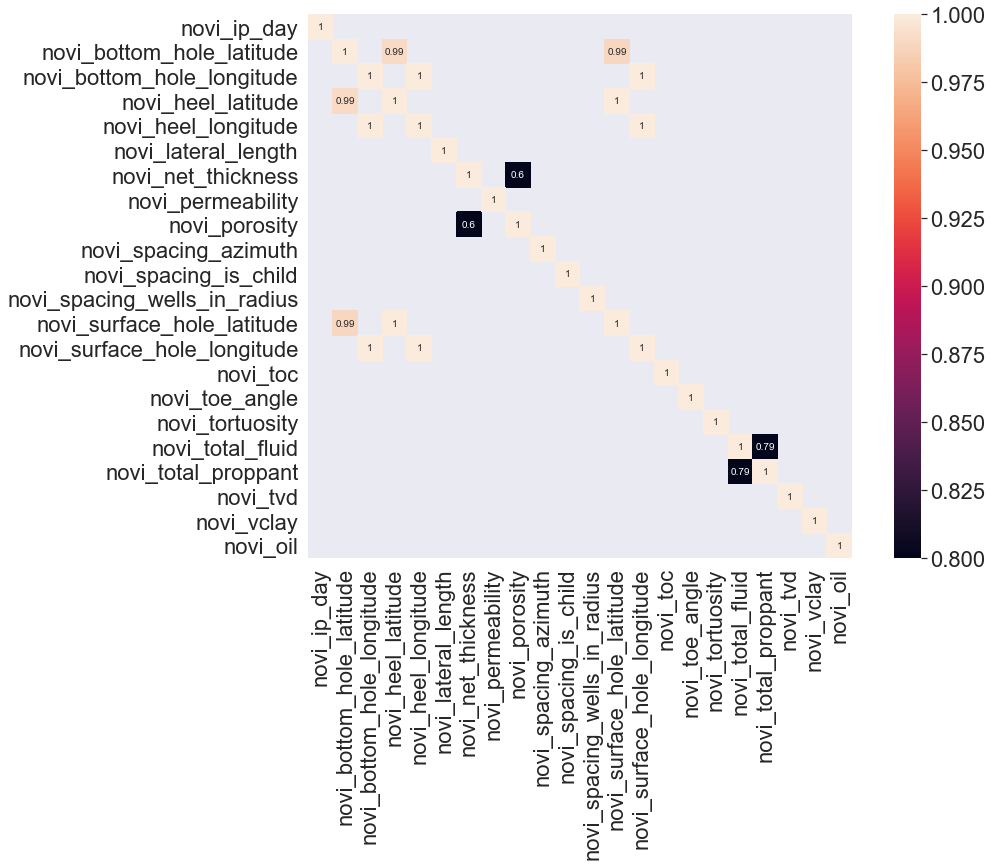

In [448]:
plt.subplots(figsize=(15,10))
hot_corrmat=corrmat[corrmat>0.6]
sns.heatmap(hot_corrmat, vmin=0.8, vmax=1, square=True,annot=True)

**porosity vs thickness**
**total_proppant vs total_fluid**

<AxesSubplot:>

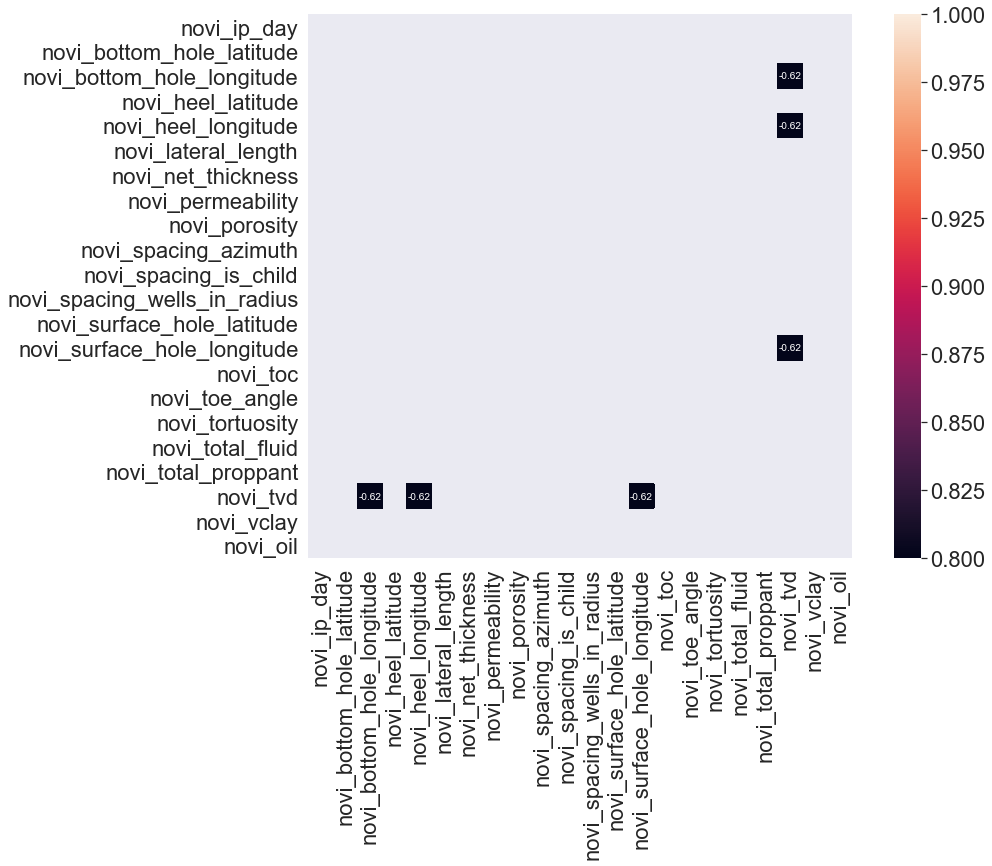

In [449]:
plt.subplots(figsize=(15,10))
hot_corrmat=corrmat[corrmat<-0.6]
sns.heatmap(hot_corrmat, vmin=0.8, vmax=1, square=True,annot=True)

**geology correlation**

#cum oil change with production time for all the wells

pd.DataFrame({'cum oil':np.squeeze(Features_middle[['novi_oil']].values),'Pro Timing':np.squeeze(Features_middle[['novi_ip_day']].values)}).groupby('Pro Timing').mean().plot(kind='bar')

C:\Users\Welcome\anaconda3\lib\site-packages\seaborn\axisgrid.py:1969: UserWarning: The `size` parameter has been renamed to `height`; please update your code.
  warnings.warn(msg, UserWarning)


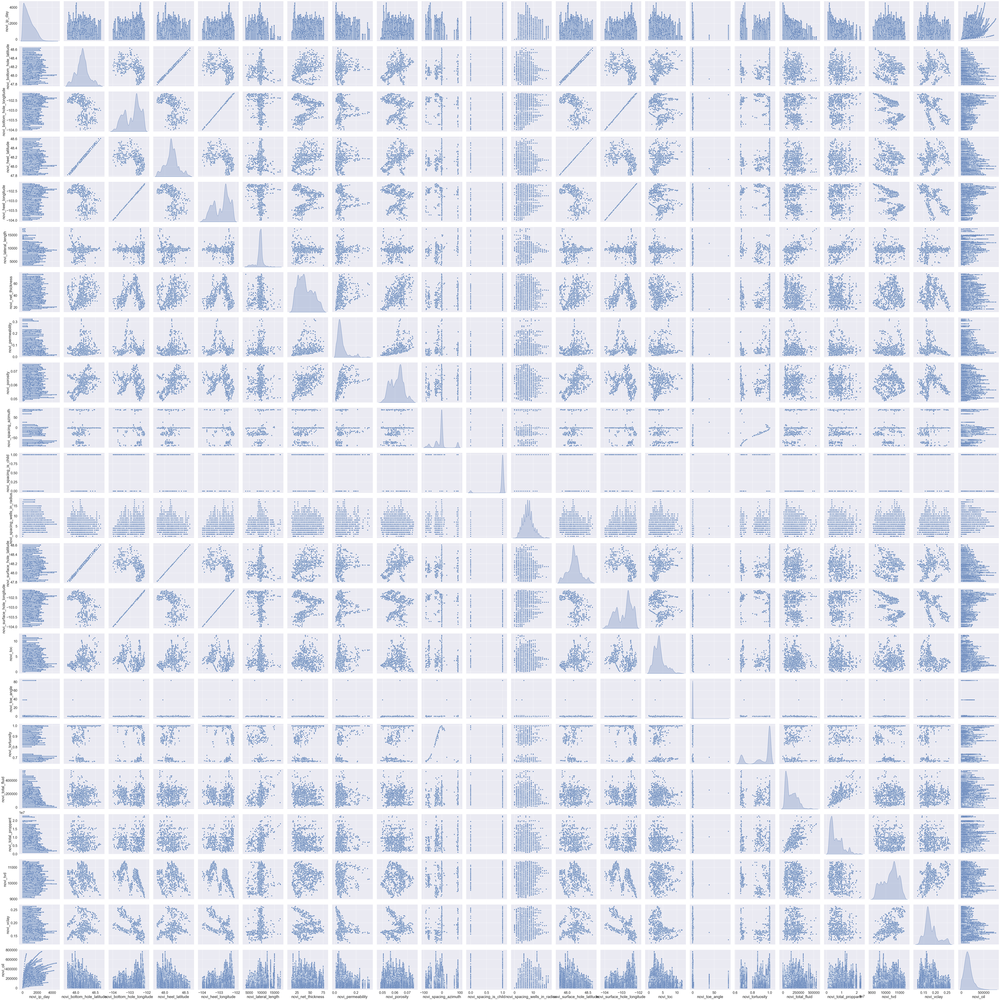

In [341]:
sns.set(font_scale=2)
sns.pairplot(Features_middle,size=4,markers="o",diag_kind="kde")

In [342]:
Features_analy=Features_middle.drop(columns=['novi_ip_day','novi_oil'])
Features_analy

,novi_unique_key,novi_bottom_hole_latitude,novi_bottom_hole_longitude,novi_current_operator,novi_formation,novi_heel_latitude,novi_heel_longitude,novi_lateral_length,novi_net_thickness,novi_permeability,novi_porosity,novi_region,novi_spacing_azimuth,novi_spacing_is_child,novi_spacing_wells_in_radius,novi_surface_hole_latitude,novi_surface_hole_longitude,novi_toc,novi_toe_angle,novi_tortuosity,novi_total_fluid,novi_total_proppant,novi_tvd,novi_vclay
0,33061005990000,48.012837,-102.380303,Whiting,Middle Bakken,48.02116,-102.40436,9297.666667,20.857313,0.016807,0.053066,Mountrail,-64.659417,1.0,2.0,48.02246,-102.40635,2.615370,-0.781249,0.712625,0.000000,1840000.0,9956.671233,0.168064
1,33061005990000,48.012837,-102.380303,Whiting,Middle Bakken,48.02116,-102.40436,9297.666667,20.857313,0.016807,0.053066,Mountrail,-64.659417,1.0,2.0,48.02246,-102.40635,2.615370,-0.781249,0.712625,0.000000,1840000.0,9956.671233,0.168064
2,33061005990000,48.012837,-102.380303,Whiting,Middle Bakken,48.02116,-102.40436,9297.666667,20.857313,0.016807,0.053066,Mountrail,-64.659417,1.0,2.0,48.02246,-102.40635,2.615370,-0.781249,0.712625,0.000000,1840000.0,9956.671233,0.168064
3,33061005990000,48.012837,-102.380303,Whiting,Middle Bakken,48.02116,-102.40436,9297.666667,20.857313,0.016807,0.053066,Mountrail,-64.659417,1.0,2.0,48.02246,-102.40635,2.615370,-0.781249,0.712625,0.000000,1840000.0,9956.671233,0.168064
4,33061005990000,48.012837,-102.380303,Whiting,Middle Bakken,48.02116,-102.40436,9297.666667,20.857313,0.016807,0.053066,Mountrail,-64.659417,1.0,2.0,48.02246,-102.40635,2.615370,-0.781249,0.712625,0.000000,1840000.0,9956.671233,0.168064
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
49529,33105053950000,48.007990,-103.837793,Nine Point Energy,Middle Bakken,48.00781,-103.87183,12423.000000,17.423451,0.084485,0.063256,Williams,88.697271,1.0,5.0,48.01421,-103.87551,3.053981,0.185720,0.670507,231479.833333,11833155.0,10396.521739,0.176241
49530,33105053950000,48.007990,-103.837793,Nine Point Energy,Middle Bakken,48.00781,-103.87183,12423.000000,17.423451,0.084485,0.063256,Williams,88.697271,1.0,5.0,48.01421,-103.87551,3.053981,0.185720,0.670507,231479.833333,11833155.0,10396.521739,0.176241
49531,33105053950000,48.007990,-103.837793,Nine Point Energy,Middle Bakken,48.00781,-103.87183,12423.000000,17.423451,0.084485,0.063256,Williams,88.697271,1.0,5.0,48.01421,-103.87551,3.053981,0.185720,0.670507,231479.833333,11833155.0,10396.521739,0.176241
49532,33105053950000,48.007990,-103.837793,Nine Point Energy,Middle Bakken,48.00781,-103.87183,12423.000000,17.423451,0.084485,0.063256,Williams,88.697271,1.0,5.0,48.01421,-103.87551,3.053981,0.185720,0.670507,231479.833333,11833155.0,10396.521739,0.176241


In [343]:
Features_analy.drop_duplicates(inplace=True)
Features_analy

,novi_unique_key,novi_bottom_hole_latitude,novi_bottom_hole_longitude,novi_current_operator,novi_formation,novi_heel_latitude,novi_heel_longitude,novi_lateral_length,novi_net_thickness,novi_permeability,novi_porosity,novi_region,novi_spacing_azimuth,novi_spacing_is_child,novi_spacing_wells_in_radius,novi_surface_hole_latitude,novi_surface_hole_longitude,novi_toc,novi_toe_angle,novi_tortuosity,novi_total_fluid,novi_total_proppant,novi_tvd,novi_vclay
0,33061005990000,48.012837,-102.380303,Whiting,Middle Bakken,48.02116,-102.40436,9297.666667,20.857313,0.016807,0.053066,Mountrail,-64.659417,1.0,2.0,48.02246,-102.40635,2.615370,-0.781249,0.712625,0.000000,1840000.0,9956.671233,0.168064
22,33061005990000,48.012837,-102.380303,Whiting,Middle Bakken,48.02116,-102.40436,9297.666667,20.857313,0.016807,0.053066,Mountrail,-64.659417,1.0,3.0,48.02246,-102.40635,2.615370,-0.781249,0.712625,0.000000,1840000.0,9956.671233,0.168064
38,33061005990000,48.012837,-102.380303,Whiting,Middle Bakken,48.02116,-102.40436,9297.666667,20.857313,0.016807,0.053066,Mountrail,-64.659417,1.0,4.0,48.02246,-102.40635,2.615370,-0.781249,0.712625,0.000000,1840000.0,9956.671233,0.168064
56,33061005990000,48.012837,-102.380303,Whiting,Middle Bakken,48.02116,-102.40436,9297.666667,20.857313,0.016807,0.053066,Mountrail,-64.659417,1.0,6.0,48.02246,-102.40635,2.615370,-0.781249,0.712625,0.000000,1840000.0,9956.671233,0.168064
153,33061007120000,47.998690,-102.422770,Whiting,Middle Bakken,48.00526,-102.44754,9356.000000,20.140680,0.011500,0.050800,Mountrail,-70.341866,1.0,2.0,48.00657,-102.44942,1.645790,-0.849376,0.697064,17560.000000,1801000.0,10181.744828,0.162000
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
49508,33105053840000,48.459130,-103.472987,Crescent Point Energy,Three Forks,48.43200,-103.47290,9901.666667,43.208814,0.027603,0.059030,Williams,-1.264627,1.0,5.0,48.43172,-103.47429,4.255433,-0.787494,0.999449,218742.095238,6731602.0,10228.763636,0.233735
49514,33105053850000,48.458657,-103.513997,Crescent Point Energy,Three Forks,48.43235,-103.51395,9598.666667,38.371056,0.024941,0.057790,Williams,-1.179764,1.0,6.0,48.43156,-103.51045,4.051978,-0.634982,0.999667,229433.857143,6732751.0,10234.018519,0.236875
49522,33105053920000,48.430260,-103.673603,Enerplus,Middle Bakken,48.40337,-103.67356,9816.333333,39.326320,0.041249,0.063266,Williams,-1.053695,1.0,4.0,48.40088,-103.67212,4.948539,-0.681601,0.999150,332913.000000,15308066.0,10000.490909,0.182506
49524,33105053930000,48.430250,-103.676720,Enerplus,Middle Bakken,48.40334,-103.67666,9824.000000,39.018047,0.041077,0.063500,Williams,-1.074945,1.0,3.0,48.40088,-103.67232,4.901266,-0.482599,0.999078,334988.000000,15284632.0,10011.509091,0.182790


<AxesSubplot:ylabel='novi_spacing_wells_in_radius'>

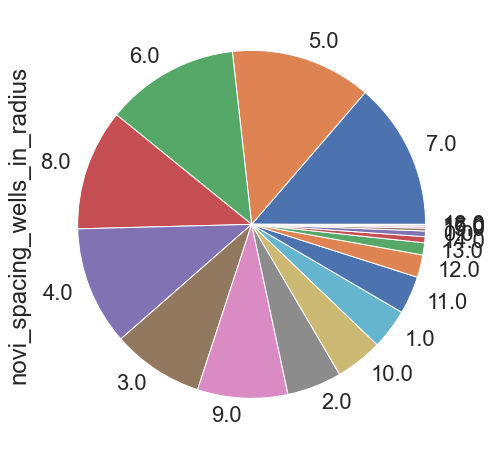

In [344]:
Features_analy['novi_spacing_wells_in_radius'].value_counts().plot(kind='pie')

# novi_spacing_wells_in_radius is changing at different production timing, the effect of well interference

In [345]:
Features_analy2=Features_analy.copy().drop(columns=['novi_spacing_wells_in_radius'])
Features_analy2.drop_duplicates(keep='last',inplace=True)
Features_analy2

,novi_unique_key,novi_bottom_hole_latitude,novi_bottom_hole_longitude,novi_current_operator,novi_formation,novi_heel_latitude,novi_heel_longitude,novi_lateral_length,novi_net_thickness,novi_permeability,novi_porosity,novi_region,novi_spacing_azimuth,novi_spacing_is_child,novi_surface_hole_latitude,novi_surface_hole_longitude,novi_toc,novi_toe_angle,novi_tortuosity,novi_total_fluid,novi_total_proppant,novi_tvd,novi_vclay
56,33061005990000,48.012837,-102.380303,Whiting,Middle Bakken,48.02116,-102.40436,9297.666667,20.857313,0.016807,0.053066,Mountrail,-64.659417,1.0,48.02246,-102.40635,2.615370,-0.781249,0.712625,0.000000,1840000.0,9956.671233,0.168064
194,33061007120000,47.998690,-102.422770,Whiting,Middle Bakken,48.00526,-102.44754,9356.000000,20.140680,0.011500,0.050800,Mountrail,-70.341866,1.0,48.00657,-102.44942,1.645790,-0.849376,0.697064,17560.000000,1801000.0,10181.744828,0.162000
320,33061007560000,48.008777,-102.380040,Whiting,Middle Bakken,48.01422,-102.40362,8832.333333,20.038529,0.016388,0.052843,Mountrail,-72.954338,1.0,48.01473,-102.40594,2.099914,-0.782205,0.691193,23226.000000,2313940.0,9965.255102,0.166431
437,33061015420000,48.350517,-102.557103,EOG,Middle Bakken,48.32935,-102.53990,9956.000000,53.029465,0.060784,0.071333,Mountrail,-30.283314,1.0,48.32782,-102.53844,0.647396,-0.141346,0.882160,51084.000000,3064563.0,9836.281690,0.158631
614,33061015870000,48.283113,-102.708267,Hess,Middle Bakken,48.25919,-102.70816,10037.333333,58.410696,0.086995,0.072000,Mountrail,-1.881323,0.0,48.25377,-102.70527,2.097238,-0.330451,0.999197,83124.000000,3971640.0,10368.607143,0.178905
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
49508,33105053840000,48.459130,-103.472987,Crescent Point Energy,Three Forks,48.43200,-103.47290,9901.666667,43.208814,0.027603,0.059030,Williams,-1.264627,1.0,48.43172,-103.47429,4.255433,-0.787494,0.999449,218742.095238,6731602.0,10228.763636,0.233735
49514,33105053850000,48.458657,-103.513997,Crescent Point Energy,Three Forks,48.43235,-103.51395,9598.666667,38.371056,0.024941,0.057790,Williams,-1.179764,1.0,48.43156,-103.51045,4.051978,-0.634982,0.999667,229433.857143,6732751.0,10234.018519,0.236875
49522,33105053920000,48.430260,-103.673603,Enerplus,Middle Bakken,48.40337,-103.67356,9816.333333,39.326320,0.041249,0.063266,Williams,-1.053695,1.0,48.40088,-103.67212,4.948539,-0.681601,0.999150,332913.000000,15308066.0,10000.490909,0.182506
49524,33105053930000,48.430250,-103.676720,Enerplus,Middle Bakken,48.40334,-103.67666,9824.000000,39.018047,0.041077,0.063500,Williams,-1.074945,1.0,48.40088,-103.67232,4.901266,-0.482599,0.999078,334988.000000,15284632.0,10011.509091,0.182790


In [346]:
Features_analy2.info()

<class 'pandas.core.frame.DataFrame'>
Int64Index: 1082 entries, 56 to 49526
Data columns (total 23 columns):
 #   Column                       Non-Null Count  Dtype  
---  ------                       --------------  -----  
 0   novi_unique_key              1082 non-null   object 
 1   novi_bottom_hole_latitude    1082 non-null   float64
 2   novi_bottom_hole_longitude   1082 non-null   float64
 3   novi_current_operator        1082 non-null   object 
 4   novi_formation               1082 non-null   object 
 5   novi_heel_latitude           1082 non-null   float64
 6   novi_heel_longitude          1082 non-null   float64
 7   novi_lateral_length          1082 non-null   float64
 8   novi_net_thickness           1082 non-null   float64
 9   novi_permeability            1082 non-null   float64
 10  novi_porosity                1082 non-null   float64
 11  novi_region                  1082 non-null   object 
 12  novi_spacing_azimuth         1082 non-null   float64
 13  novi_spacing_is_

In [347]:
Features_analy2.describe()

,novi_bottom_hole_latitude,novi_bottom_hole_longitude,novi_heel_latitude,novi_heel_longitude,novi_lateral_length,novi_net_thickness,novi_permeability,novi_porosity,novi_spacing_azimuth,novi_spacing_is_child,novi_surface_hole_latitude,novi_surface_hole_longitude,novi_toc,novi_toe_angle,novi_tortuosity,novi_total_fluid,novi_total_proppant,novi_tvd,novi_vclay
count,1082.000000,1082.000000,1082.000000,1082.000000,1082.000000,1082.000000,1082.000000,1082.000000,1082.000000,1082.000000,1082.000000,1082.000000,1082.000000,1082.000000,1082.000000,1082.000000,1.082000e+03,1082.000000,1082.000000
mean,48.157648,-102.892294,48.160002,-102.892493,9337.739680,40.290008,0.064062,0.061373,-2.632650,0.949168,48.160315,-102.892481,3.747937,0.118552,0.917987,167277.245665,7.791043e+06,10357.730446,0.181845
std,0.168234,0.482554,0.164704,0.482341,1568.028422,14.126892,0.046879,0.005373,38.178260,0.219756,0.164472,0.482400,2.052087,2.820635,0.126426,91796.739465,4.108701e+06,535.037367,0.029086
min,47.790470,-103.987343,47.816070,-103.987350,3566.333333,15.126605,0.011000,0.048664,-89.929023,0.000000,47.817000,-103.989200,0.015285,-1.367158,0.657766,0.000000,9.199320e+05,9085.656250,0.123551
25%,48.053833,-103.351755,48.059545,-103.351723,9048.916667,28.429017,0.036398,0.057000,-9.416903,1.000000,48.060545,-103.352360,2.248777,-0.349729,0.868337,82189.559524,4.125797e+06,9956.827499,0.163830
50%,48.166360,-102.748317,48.165670,-102.746835,9537.000000,38.162714,0.050983,0.062319,-1.644829,1.000000,48.167140,-102.744635,3.458457,0.043991,0.998126,168755.976190,7.505638e+06,10433.023392,0.173790
75%,48.256099,-102.495713,48.256785,-102.498190,9824.000000,51.244339,0.072176,0.065094,-1.082281,1.000000,48.255700,-102.499225,4.558857,0.350955,0.999296,226078.035714,1.000509e+07,10742.505896,0.195129
max,48.632670,-102.138750,48.607630,-102.119290,17334.333333,75.928591,0.322302,0.075000,89.376944,1.000000,48.605410,-102.117670,11.879607,82.891793,1.000005,541214.000000,2.271827e+07,11391.800000,0.262732


# final total_fluid shouldn't be zero, outlier wells, remove these wells

In [348]:
Features_analy2[Features_analy2['novi_total_fluid']==0]['novi_unique_key'].unique().tolist()

['33061005990000', '33061044270000']

In [349]:
Features_analy2=Features_analy2.drop(Features_analy2[Features_analy2['novi_unique_key'].isin(Features_analy2[Features_analy2['novi_total_fluid']==0]['novi_unique_key'].unique().tolist())].index)

In [350]:
Features_middle=Features_middle.drop(Features_middle[Features_middle['novi_unique_key'].isin(Features_analy2[Features_analy2['novi_total_fluid']==0]['novi_unique_key'].unique().tolist())].index)

In [351]:
Features_analy2

,novi_unique_key,novi_bottom_hole_latitude,novi_bottom_hole_longitude,novi_current_operator,novi_formation,novi_heel_latitude,novi_heel_longitude,novi_lateral_length,novi_net_thickness,novi_permeability,novi_porosity,novi_region,novi_spacing_azimuth,novi_spacing_is_child,novi_surface_hole_latitude,novi_surface_hole_longitude,novi_toc,novi_toe_angle,novi_tortuosity,novi_total_fluid,novi_total_proppant,novi_tvd,novi_vclay
194,33061007120000,47.998690,-102.422770,Whiting,Middle Bakken,48.00526,-102.44754,9356.000000,20.140680,0.011500,0.050800,Mountrail,-70.341866,1.0,48.00657,-102.44942,1.645790,-0.849376,0.697064,17560.000000,1801000.0,10181.744828,0.162000
320,33061007560000,48.008777,-102.380040,Whiting,Middle Bakken,48.01422,-102.40362,8832.333333,20.038529,0.016388,0.052843,Mountrail,-72.954338,1.0,48.01473,-102.40594,2.099914,-0.782205,0.691193,23226.000000,2313940.0,9965.255102,0.166431
437,33061015420000,48.350517,-102.557103,EOG,Middle Bakken,48.32935,-102.53990,9956.000000,53.029465,0.060784,0.071333,Mountrail,-30.283314,1.0,48.32782,-102.53844,0.647396,-0.141346,0.882160,51084.000000,3064563.0,9836.281690,0.158631
614,33061015870000,48.283113,-102.708267,Hess,Middle Bakken,48.25919,-102.70816,10037.333333,58.410696,0.086995,0.072000,Mountrail,-1.881323,0.0,48.25377,-102.70527,2.097238,-0.330451,0.999197,83124.000000,3971640.0,10368.607143,0.178905
617,33061016180000,47.935287,-102.310447,Slawson,Middle Bakken,47.96231,-102.30999,9890.000000,18.950350,0.029457,0.054500,Mountrail,-1.347500,1.0,47.96437,-102.31049,1.722918,0.470716,0.996946,19320.000000,1700000.0,9640.987654,0.165549
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
49508,33105053840000,48.459130,-103.472987,Crescent Point Energy,Three Forks,48.43200,-103.47290,9901.666667,43.208814,0.027603,0.059030,Williams,-1.264627,1.0,48.43172,-103.47429,4.255433,-0.787494,0.999449,218742.095238,6731602.0,10228.763636,0.233735
49514,33105053850000,48.458657,-103.513997,Crescent Point Energy,Three Forks,48.43235,-103.51395,9598.666667,38.371056,0.024941,0.057790,Williams,-1.179764,1.0,48.43156,-103.51045,4.051978,-0.634982,0.999667,229433.857143,6732751.0,10234.018519,0.236875
49522,33105053920000,48.430260,-103.673603,Enerplus,Middle Bakken,48.40337,-103.67356,9816.333333,39.326320,0.041249,0.063266,Williams,-1.053695,1.0,48.40088,-103.67212,4.948539,-0.681601,0.999150,332913.000000,15308066.0,10000.490909,0.182506
49524,33105053930000,48.430250,-103.676720,Enerplus,Middle Bakken,48.40334,-103.67666,9824.000000,39.018047,0.041077,0.063500,Williams,-1.074945,1.0,48.40088,-103.67232,4.901266,-0.482599,0.999078,334988.000000,15284632.0,10011.509091,0.182790


C:\Users\Welcome\anaconda3\lib\site-packages\seaborn\axisgrid.py:1969: UserWarning: The `size` parameter has been renamed to `height`; please update your code.
  warnings.warn(msg, UserWarning)


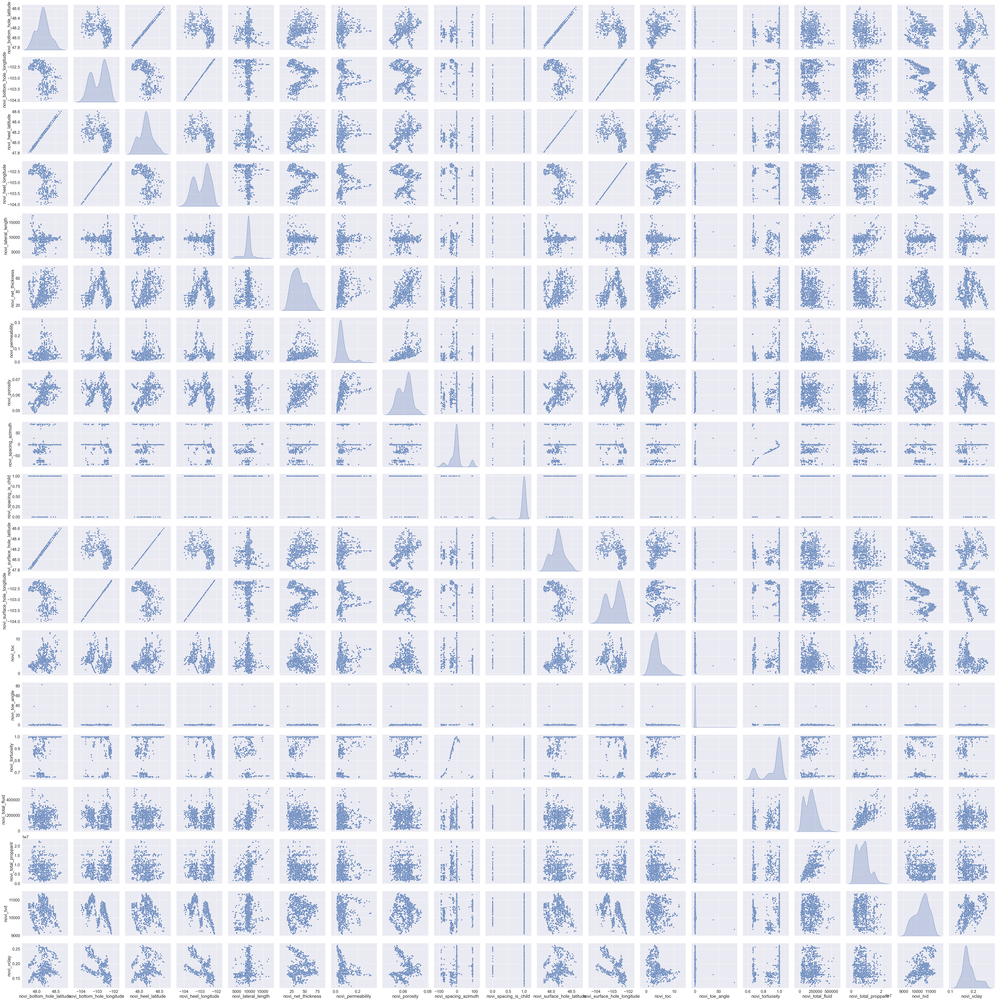

In [352]:

sns.set(font_scale=2)
sns.pairplot(Features_analy2,size=4,markers="o",diag_kind="kde")

**operaters, region, formation statistics**

In [353]:
Features_analy2['novi_current_operator'].value_counts()

Hess                     211
Whiting                  174
EOG                      130
Continental Resources    115
Oasis                     84
Slawson                   67
Marathon                  56
Kraken Operating          55
Grayson Mill Energy       54
Exxon Mobil               32
Crescent Point Energy     25
Liberty Resources         17
Zavanna                   12
Nine Point Energy         12
Devon Energy              12
Enerplus                   9
Lime Rock III              8
Sinclair                   5
Murex Petroleum            1
Petrogulf Corporation      1
Name: novi_current_operator, dtype: int64

<AxesSubplot:ylabel='novi_current_operator'>

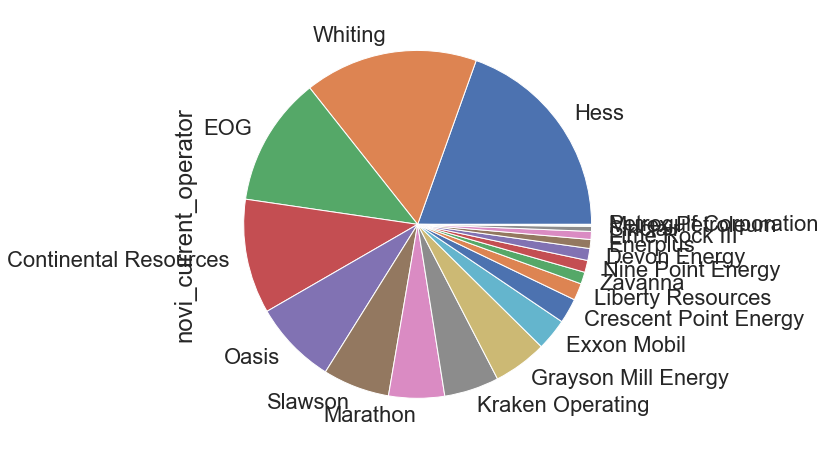

In [354]:
Features_analy2['novi_current_operator'].value_counts().plot(kind='pie')

<AxesSubplot:ylabel='novi_region'>

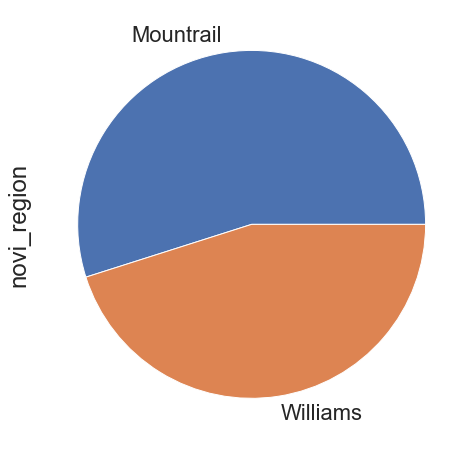

In [355]:
Features_analy2['novi_region'].value_counts().plot(kind='pie')

<AxesSubplot:ylabel='novi_formation'>

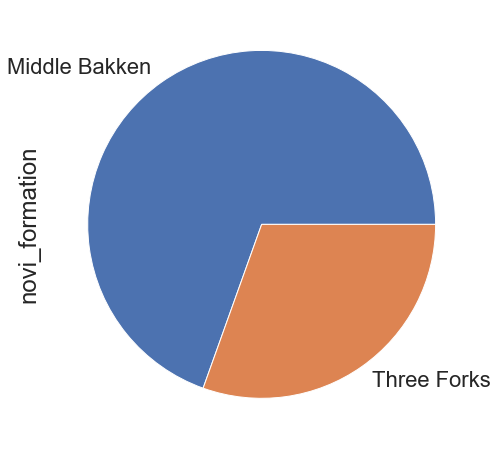

In [356]:
Features_analy2['novi_formation'].value_counts().plot(kind='pie')

<AxesSubplot:xlabel='Operators'>

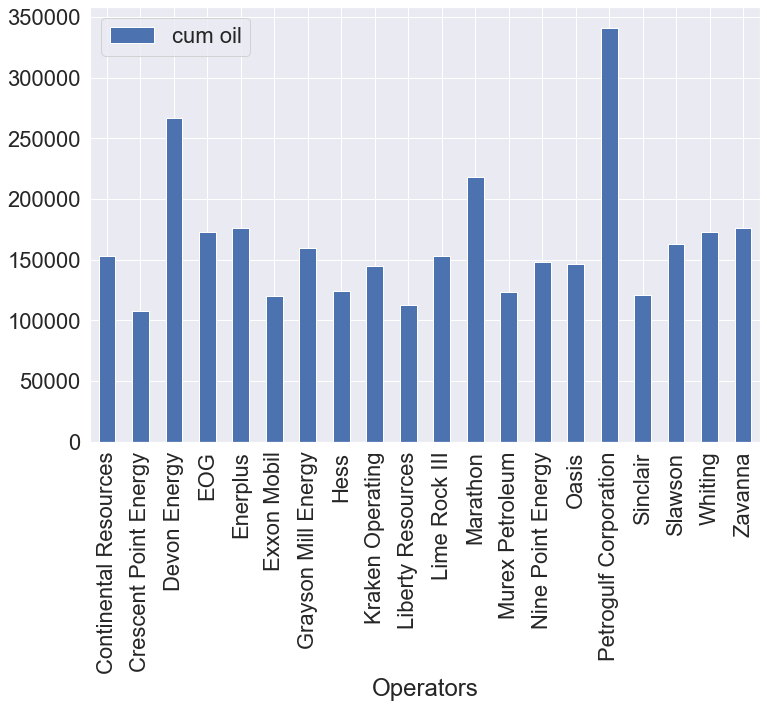

In [357]:
pd.DataFrame({'cum oil':np.squeeze(Features_middle[['novi_oil']].values),'Operators':np.squeeze(Features_middle[['novi_current_operator']].values)}).groupby('Operators').mean().plot(kind='bar')

# depends on where they are (geology), completion and production strategy

# remove operators having wells number<=10,  maybe not representative and outliers, also will be difficult to generlize

Enerplus                   9
Lime Rock III              8
Sinclair                   5  (too low)
Murex Petroleum            1
Petrogulf Corporation      1  (too high)

In [358]:
Features_analy2['novi_current_operator'].value_counts()

Hess                     211
Whiting                  174
EOG                      130
Continental Resources    115
Oasis                     84
Slawson                   67
Marathon                  56
Kraken Operating          55
Grayson Mill Energy       54
Exxon Mobil               32
Crescent Point Energy     25
Liberty Resources         17
Zavanna                   12
Nine Point Energy         12
Devon Energy              12
Enerplus                   9
Lime Rock III              8
Sinclair                   5
Murex Petroleum            1
Petrogulf Corporation      1
Name: novi_current_operator, dtype: int64

In [359]:
Count=Features_analy2['novi_current_operator'].value_counts()[Features_analy2['novi_current_operator'].value_counts()<10]

In [360]:
Count

Enerplus                 9
Lime Rock III            8
Sinclair                 5
Murex Petroleum          1
Petrogulf Corporation    1
Name: novi_current_operator, dtype: int64

In [361]:
Count.index.tolist()

['Enerplus',
 'Lime Rock III',
 'Sinclair',
 'Murex Petroleum',
 'Petrogulf Corporation']

In [362]:
Features_analy2=Features_analy2.drop(Features_analy2[Features_analy2['novi_current_operator'].isin(Count.index.tolist())].index)

In [363]:
Features_middle=Features_middle.drop(Features_middle[Features_middle['novi_current_operator'].isin(Count.index.tolist())].index)

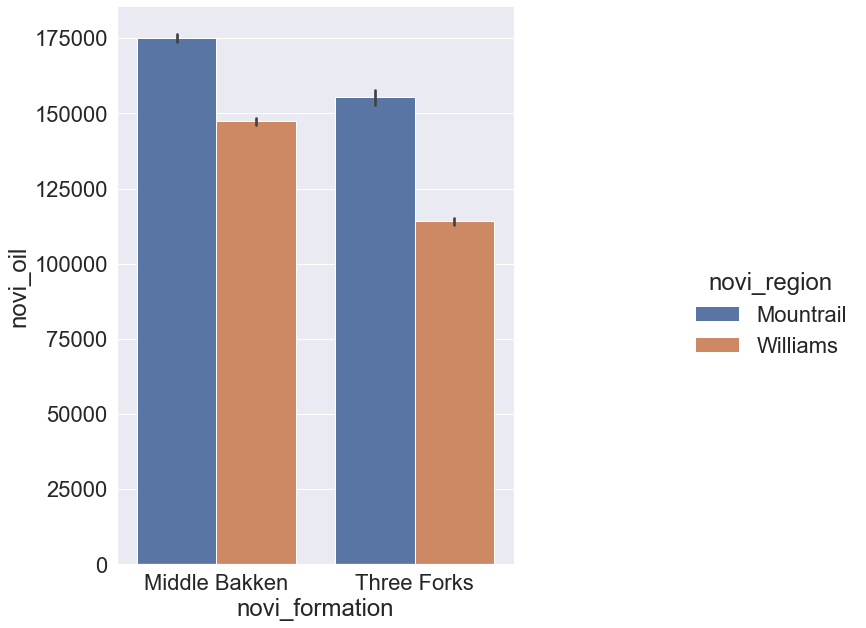

In [366]:
ax=sns.catplot(x='novi_formation', y='novi_oil', hue='novi_region',  kind='bar', data=Features_middle)
ax.fig.set_figwidth(15)
ax.fig.set_figheight(10)

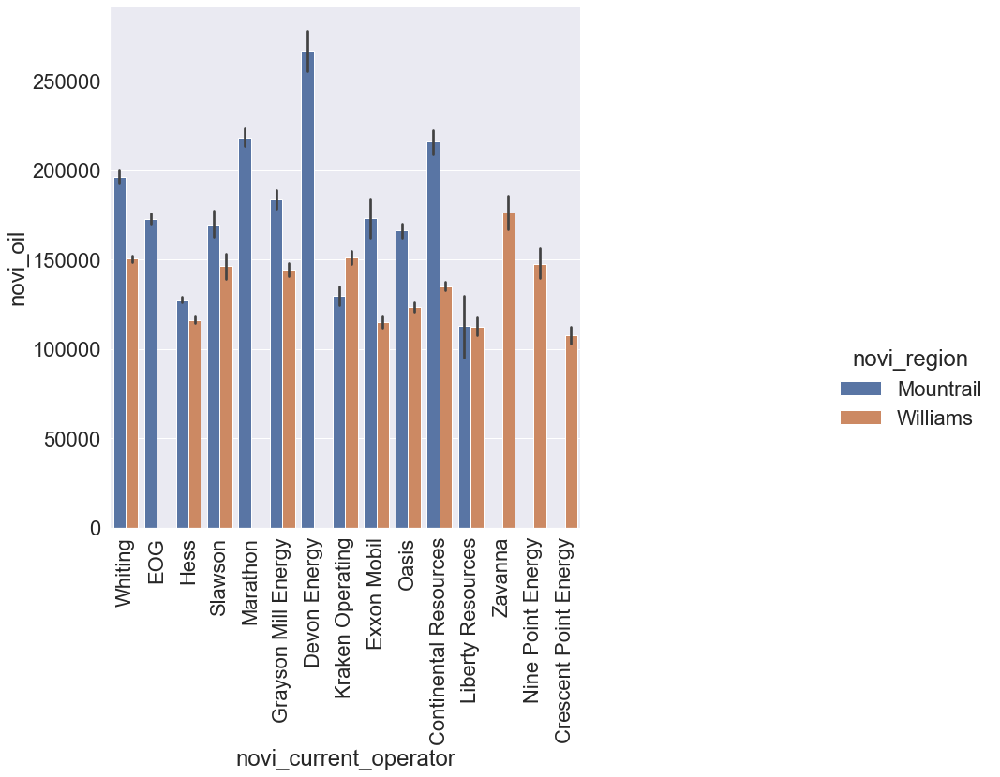

In [368]:
ax=sns.catplot(x='novi_current_operator', y='novi_oil', hue='novi_region',  kind='bar', data=Features_middle)
ax.fig.set_figwidth(19)
ax.fig.set_figheight(10)

ax.set_xticklabels(rotation=90)

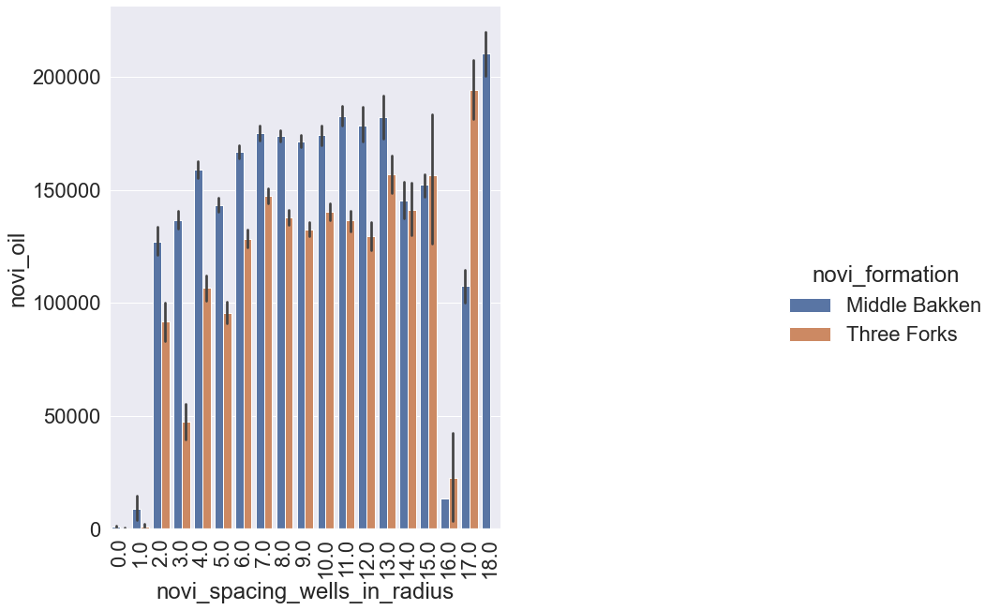

In [369]:
ax=sns.catplot(x='novi_spacing_wells_in_radius', y='novi_oil', hue='novi_formation',  kind='bar', data=Features_middle)
ax.fig.set_figwidth(19)
ax.fig.set_figheight(10)

ax.set_xticklabels(rotation=90)

# 6-13 is a good range for both formations,  well interference effect

In [371]:
Features_middle.reset_index(drop=True,inplace=True)
Features_middle

,novi_unique_key,novi_ip_day,novi_bottom_hole_latitude,novi_bottom_hole_longitude,novi_current_operator,novi_formation,novi_heel_latitude,novi_heel_longitude,novi_lateral_length,novi_net_thickness,novi_permeability,novi_porosity,novi_region,novi_spacing_azimuth,novi_spacing_is_child,novi_spacing_wells_in_radius,novi_surface_hole_latitude,novi_surface_hole_longitude,novi_toc,novi_toe_angle,novi_tortuosity,novi_total_fluid,novi_total_proppant,novi_tvd,novi_vclay,novi_oil
0,33061005990000,1,48.012837,-102.380303,Whiting,Middle Bakken,48.02116,-102.40436,9297.666667,20.857313,0.016807,0.053066,Mountrail,-64.659417,1.0,2.0,48.02246,-102.40635,2.615370,-0.781249,0.712625,0.000000,1840000.0,9956.671233,0.168064,1179.000000
1,33061005990000,30,48.012837,-102.380303,Whiting,Middle Bakken,48.02116,-102.40436,9297.666667,20.857313,0.016807,0.053066,Mountrail,-64.659417,1.0,2.0,48.02246,-102.40635,2.615370,-0.781249,0.712625,0.000000,1840000.0,9956.671233,0.168064,25758.870968
2,33061005990000,60,48.012837,-102.380303,Whiting,Middle Bakken,48.02116,-102.40436,9297.666667,20.857313,0.016807,0.053066,Mountrail,-64.659417,1.0,2.0,48.02246,-102.40635,2.615370,-0.781249,0.712625,0.000000,1840000.0,9956.671233,0.168064,42765.580645
3,33061005990000,90,48.012837,-102.380303,Whiting,Middle Bakken,48.02116,-102.40436,9297.666667,20.857313,0.016807,0.053066,Mountrail,-64.659417,1.0,2.0,48.02246,-102.40635,2.615370,-0.781249,0.712625,0.000000,1840000.0,9956.671233,0.168064,55792.166667
4,33061005990000,120,48.012837,-102.380303,Whiting,Middle Bakken,48.02116,-102.40436,9297.666667,20.857313,0.016807,0.053066,Mountrail,-64.659417,1.0,2.0,48.02246,-102.40635,2.615370,-0.781249,0.712625,0.000000,1840000.0,9956.671233,0.168064,67145.806452
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
44354,33105053950000,90,48.007990,-103.837793,Nine Point Energy,Middle Bakken,48.00781,-103.87183,12423.000000,17.423451,0.084485,0.063256,Williams,88.697271,1.0,5.0,48.01421,-103.87551,3.053981,0.185720,0.670507,231479.833333,11833155.0,10396.521739,0.176241,39418.000000
44355,33105053950000,120,48.007990,-103.837793,Nine Point Energy,Middle Bakken,48.00781,-103.87183,12423.000000,17.423451,0.084485,0.063256,Williams,88.697271,1.0,5.0,48.01421,-103.87551,3.053981,0.185720,0.670507,231479.833333,11833155.0,10396.521739,0.176241,59764.000000
44356,33105053950000,150,48.007990,-103.837793,Nine Point Energy,Middle Bakken,48.00781,-103.87183,12423.000000,17.423451,0.084485,0.063256,Williams,88.697271,1.0,5.0,48.01421,-103.87551,3.053981,0.185720,0.670507,231479.833333,11833155.0,10396.521739,0.176241,79838.838710
44357,33105053950000,180,48.007990,-103.837793,Nine Point Energy,Middle Bakken,48.00781,-103.87183,12423.000000,17.423451,0.084485,0.063256,Williams,88.697271,1.0,5.0,48.01421,-103.87551,3.053981,0.185720,0.670507,231479.833333,11833155.0,10396.521739,0.176241,94405.766667


**use one hot encoder to deal with three categorical features**

In [372]:

from sklearn.preprocessing import OneHotEncoder
onehotencoder =OneHotEncoder()
Features_middle_region=onehotencoder.fit_transform(Features_middle['novi_region'].values.reshape(-1,1)).toarray()
Features_middle_region_DF=pd.DataFrame(Features_middle_region,columns=('novi_region_'+str(int(i)) for i in range(Features_middle_region.shape[1])))
Features_middle=pd.concat([Features_middle,Features_middle_region_DF],axis=1)

Features_middle_formation=onehotencoder.fit_transform(Features_middle['novi_formation'].values.reshape(-1,1)).toarray()
Features_middle_formation_DF=pd.DataFrame(Features_middle_formation,columns=('novi_formation_'+str(int(i)) for i in range(Features_middle_formation.shape[1])))
Features_middle=pd.concat([Features_middle,Features_middle_formation_DF],axis=1)

Features_middle_operator=onehotencoder.fit_transform(Features_middle['novi_current_operator'].values.reshape(-1,1)).toarray()
Features_middle_operator_DF=pd.DataFrame(Features_middle_operator,columns=('novi_current_operator_'+str(int(i)) for i in range(Features_middle_operator.shape[1])))
Features_middle=pd.concat([Features_middle,Features_middle_operator_DF],axis=1)


Features_middle

,novi_unique_key,novi_ip_day,novi_bottom_hole_latitude,novi_bottom_hole_longitude,novi_current_operator,novi_formation,novi_heel_latitude,novi_heel_longitude,novi_lateral_length,novi_net_thickness,novi_permeability,novi_porosity,novi_region,novi_spacing_azimuth,novi_spacing_is_child,novi_spacing_wells_in_radius,novi_surface_hole_latitude,novi_surface_hole_longitude,novi_toc,novi_toe_angle,novi_tortuosity,novi_total_fluid,novi_total_proppant,novi_tvd,novi_vclay,novi_oil,novi_region_0,novi_region_1,novi_formation_0,novi_formation_1,novi_current_operator_0,novi_current_operator_1,novi_current_operator_2,novi_current_operator_3,novi_current_operator_4,novi_current_operator_5,novi_current_operator_6,novi_current_operator_7,novi_current_operator_8,novi_current_operator_9,novi_current_operator_10,novi_current_operator_11,novi_current_operator_12,novi_current_operator_13,novi_current_operator_14
0,33061005990000,1,48.012837,-102.380303,Whiting,Middle Bakken,48.02116,-102.40436,9297.666667,20.857313,0.016807,0.053066,Mountrail,-64.659417,1.0,2.0,48.02246,-102.40635,2.615370,-0.781249,0.712625,0.000000,1840000.0,9956.671233,0.168064,1179.000000,1.0,0.0,1.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,1.0,0.0
1,33061005990000,30,48.012837,-102.380303,Whiting,Middle Bakken,48.02116,-102.40436,9297.666667,20.857313,0.016807,0.053066,Mountrail,-64.659417,1.0,2.0,48.02246,-102.40635,2.615370,-0.781249,0.712625,0.000000,1840000.0,9956.671233,0.168064,25758.870968,1.0,0.0,1.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,1.0,0.0
2,33061005990000,60,48.012837,-102.380303,Whiting,Middle Bakken,48.02116,-102.40436,9297.666667,20.857313,0.016807,0.053066,Mountrail,-64.659417,1.0,2.0,48.02246,-102.40635,2.615370,-0.781249,0.712625,0.000000,1840000.0,9956.671233,0.168064,42765.580645,1.0,0.0,1.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,1.0,0.0
3,33061005990000,90,48.012837,-102.380303,Whiting,Middle Bakken,48.02116,-102.40436,9297.666667,20.857313,0.016807,0.053066,Mountrail,-64.659417,1.0,2.0,48.02246,-102.40635,2.615370,-0.781249,0.712625,0.000000,1840000.0,9956.671233,0.168064,55792.166667,1.0,0.0,1.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,1.0,0.0
4,33061005990000,120,48.012837,-102.380303,Whiting,Middle Bakken,48.02116,-102.40436,9297.666667,20.857313,0.016807,0.053066,Mountrail,-64.659417,1.0,2.0,48.02246,-102.40635,2.615370,-0.781249,0.712625,0.000000,1840000.0,9956.671233,0.168064,67145.806452,1.0,0.0,1.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,1.0,0.0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
44354,33105053950000,90,48.007990,-103.837793,Nine Point Energy,Middle Bakken,48.00781,-103.87183,12423.000000,17.423451,0.084485,0.063256,Williams,88.697271,1.0,5.0,48.01421,-103.87551,3.053981,0.185720,0.670507,231479.833333,11833155.0,10396.521739,0.176241,39418.000000,0.0,1.0,1.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,1.0,0.0,0.0,0.0,0.0
44355,33105053950000,120,48.007990,-103.837793,Nine Point Energy,Middle Bakken,48.00781,-103.87183,12423.000000,17.423451,0.084485,0.063256,Williams,88.697271,1.0,5.0,48.01421,-103.87551,3.053981,0.185720,0.670507,231479.833333,11833155.0,10396.521739,0.176241,59764.000000,0.0,1.0,1.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,1.0,0.0,0.0,0.0,0.0
44356,33105053950000,150,48.007990,-103.837793,Nine Point Energy,Middle Bakken,48.00781,-103.87183,12423.000000,17.423451,0.084485,0.063256,Williams,88.697271,1.0,5.0,48.01421,-103.87551,3.053981,0.185720,0.670507,231479.833333,11833155.0,10396.521739,0.176241,79838.838710,0.0,1.0,1.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,1.0,0.0,0.0,0.0,0.0
44357,33105053950000,180,48.007990,-103.837793,Nine Point Energy,Middle Bakken,48.00781,-103.87183,12423.000000,17.423451,0.084485,0.063256,Williams,88.697271,1.0,5.0,48.01421,-103.87551,3.053981,0.185720,0.670507,231

In [375]:
Features_middle.drop(columns=['novi_current_operator','novi_formation','novi_region'],inplace=True)
Features_middle

,novi_unique_key,novi_ip_day,novi_bottom_hole_latitude,novi_bottom_hole_longitude,novi_heel_latitude,novi_heel_longitude,novi_lateral_length,novi_net_thickness,novi_permeability,novi_porosity,novi_spacing_azimuth,novi_spacing_is_child,novi_spacing_wells_in_radius,novi_surface_hole_latitude,novi_surface_hole_longitude,novi_toc,novi_toe_angle,novi_tortuosity,novi_total_fluid,novi_total_proppant,novi_tvd,novi_vclay,novi_oil,novi_region_0,novi_region_1,novi_formation_0,novi_formation_1,novi_current_operator_0,novi_current_operator_1,novi_current_operator_2,novi_current_operator_3,novi_current_operator_4,novi_current_operator_5,novi_current_operator_6,novi_current_operator_7,novi_current_operator_8,novi_current_operator_9,novi_current_operator_10,novi_current_operator_11,novi_current_operator_12,novi_current_operator_13,novi_current_operator_14
0,33061005990000,1,48.012837,-102.380303,48.02116,-102.40436,9297.666667,20.857313,0.016807,0.053066,-64.659417,1.0,2.0,48.02246,-102.40635,2.615370,-0.781249,0.712625,0.000000,1840000.0,9956.671233,0.168064,1179.000000,1.0,0.0,1.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,1.0,0.0
1,33061005990000,30,48.012837,-102.380303,48.02116,-102.40436,9297.666667,20.857313,0.016807,0.053066,-64.659417,1.0,2.0,48.02246,-102.40635,2.615370,-0.781249,0.712625,0.000000,1840000.0,9956.671233,0.168064,25758.870968,1.0,0.0,1.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,1.0,0.0
2,33061005990000,60,48.012837,-102.380303,48.02116,-102.40436,9297.666667,20.857313,0.016807,0.053066,-64.659417,1.0,2.0,48.02246,-102.40635,2.615370,-0.781249,0.712625,0.000000,1840000.0,9956.671233,0.168064,42765.580645,1.0,0.0,1.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,1.0,0.0
3,33061005990000,90,48.012837,-102.380303,48.02116,-102.40436,9297.666667,20.857313,0.016807,0.053066,-64.659417,1.0,2.0,48.02246,-102.40635,2.615370,-0.781249,0.712625,0.000000,1840000.0,9956.671233,0.168064,55792.166667,1.0,0.0,1.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,1.0,0.0
4,33061005990000,120,48.012837,-102.380303,48.02116,-102.40436,9297.666667,20.857313,0.016807,0.053066,-64.659417,1.0,2.0,48.02246,-102.40635,2.615370,-0.781249,0.712625,0.000000,1840000.0,9956.671233,0.168064,67145.806452,1.0,0.0,1.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,1.0,0.0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
44354,33105053950000,90,48.007990,-103.837793,48.00781,-103.87183,12423.000000,17.423451,0.084485,0.063256,88.697271,1.0,5.0,48.01421,-103.87551,3.053981,0.185720,0.670507,231479.833333,11833155.0,10396.521739,0.176241,39418.000000,0.0,1.0,1.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,1.0,0.0,0.0,0.0,0.0
44355,33105053950000,120,48.007990,-103.837793,48.00781,-103.87183,12423.000000,17.423451,0.084485,0.063256,88.697271,1.0,5.0,48.01421,-103.87551,3.053981,0.185720,0.670507,231479.833333,11833155.0,10396.521739,0.176241,59764.000000,0.0,1.0,1.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,1.0,0.0,0.0,0.0,0.0
44356,33105053950000,150,48.007990,-103.837793,48.00781,-103.87183,12423.000000,17.423451,0.084485,0.063256,88.697271,1.0,5.0,48.01421,-103.87551,3.053981,0.185720,0.670507,231479.833333,11833155.0,10396.521739,0.176241,79838.838710,0.0,1.0,1.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,1.0,0.0,0.0,0.0,0.0
44357,33105053950000,180,48.007990,-103.837793,48.00781,-103.87183,12423.000000,17.423451,0.084485,0.063256,88.697271,1.0,5.0,48.01421,-103.87551,3.053981,0.185720,0.670507,231479.833333,11833155.0,10396.521739,0.176241,94405.766667,0.0,1.0,1.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,1.0,0.0,0.0,0.0,0.0


**training and testing dataset split, using shuffle**

In [384]:
from sklearn.model_selection import train_test_split

X=Features_middle.loc[:,Features_middle.columns!='novi_oil']   
y=Features_middle['novi_oil']
X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.4, shuffle=True,random_state=42)


# 2. Solution 1: random forest

In [385]:
from sklearn.metrics import mean_squared_error, r2_score
from sklearn.pipeline import Pipeline
from sklearn.preprocessing import StandardScaler
#RF
from sklearn.ensemble import RandomForestRegressor
from sklearn.metrics import mean_absolute_error, mean_squared_error, r2_score

steps = [('rescale', StandardScaler()),
         ('rfm', RandomForestRegressor(oob_score=True))]
model = Pipeline(steps)
model = model.fit(X_train, y_train)

y_train_pred = model.predict(X_train)
y_test_pred = model.predict(X_test)

print('train RMSE: {0:.2e}'.format(np.sqrt(mean_squared_error(y_train, y_train_pred))))
print('train R2: {0:.3f}'.format(r2_score(y_train, y_train_pred)))

print('test RMSE: {0:.2e}'.format(np.sqrt(mean_squared_error(y_test, y_test_pred))))
print('test R2: {0:.3f}'.format(r2_score(y_test, y_test_pred)))



train RMSE: 2.98e+03
train R2: 0.999
test RMSE: 7.73e+03
test R2: 0.993


Text(0, 0.5, 'Test_predicted')

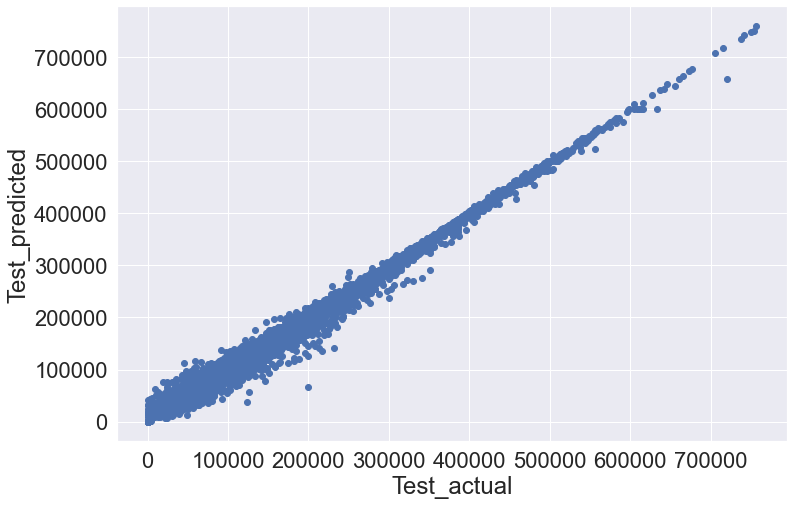

In [386]:
plt.scatter(y_test, y_test_pred)
plt.xlabel("Test_actual")
plt.ylabel("Test_predicted")

**oil production distribution in testing dataset**

<AxesSubplot:ylabel='Frequency'>

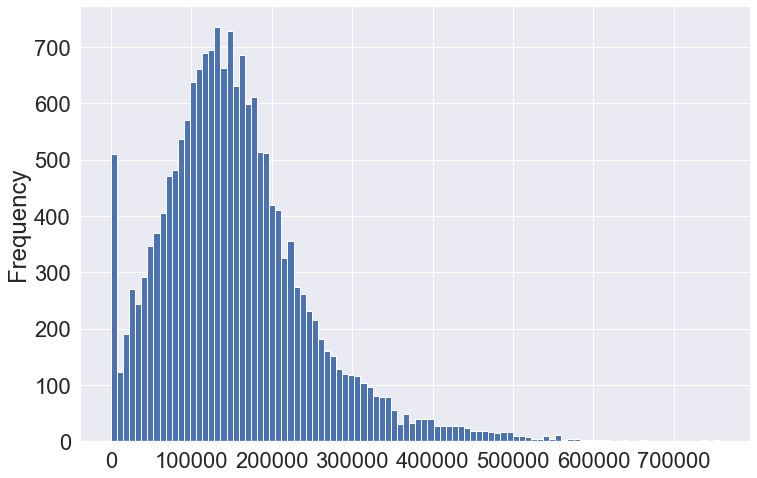

In [390]:
y_test.plot(kind='hist',bins=100)

**oil production distribution in training dataset**

<AxesSubplot:ylabel='Frequency'>

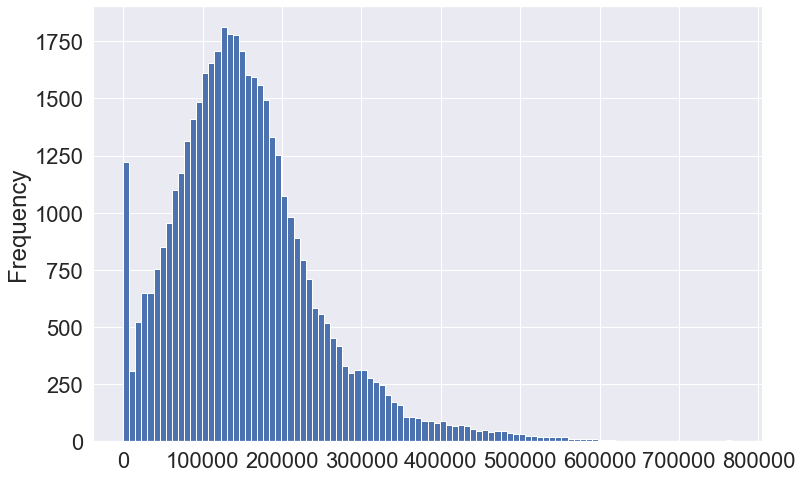

In [391]:
Features_middle['novi_oil'].plot(kind='hist',bins=100)

**feature importance**

Feature ranking:
Feature novi_ip_day (0.406223)
Feature novi_bottom_hole_latitude (0.040653)
Feature novi_bottom_hole_longitude (0.046905)
Feature novi_heel_latitude (0.016262)
Feature novi_heel_longitude (0.029164)
Feature novi_lateral_length (0.038074)
Feature novi_net_thickness (0.025402)
Feature novi_permeability (0.013904)
Feature novi_porosity (0.008977)
Feature novi_spacing_azimuth (0.010164)
Feature novi_spacing_is_child (0.000285)
Feature novi_spacing_wells_in_radius (0.009402)
Feature novi_surface_hole_latitude (0.011202)
Feature novi_surface_hole_longitude (0.014600)
Feature novi_toc (0.019267)
Feature novi_toe_angle (0.013556)
Feature novi_tortuosity (0.015010)
Feature novi_total_fluid (0.084736)
Feature novi_total_proppant (0.108946)
Feature novi_tvd (0.017331)
Feature novi_vclay (0.040905)
Feature novi_region_0 (0.000120)
Feature novi_region_1 (0.000115)
Feature novi_formation_0 (0.000306)
Feature novi_formation_1 (0.000284)
Feature novi_current_operator_0 (0.000553)
Feat

C:\Users\Welcome\anaconda3\lib\site-packages\seaborn\_decorators.py:36: FutureWarning: Pass the following variables as keyword args: x, y. From version 0.12, the only valid positional argument will be `data`, and passing other arguments without an explicit keyword will result in an error or misinterpretation.
  warnings.warn(


0.9989705823600009

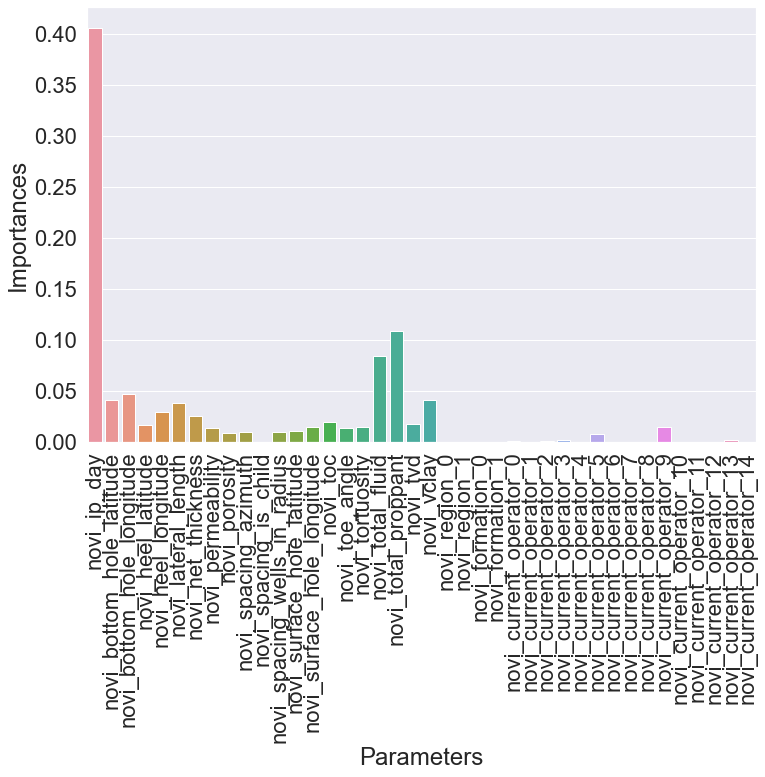

In [392]:

importances=model.steps[1][1].feature_importances_

indices=list(X_train)
print("Feature ranking:")

for f in range(X_train.shape[1]):                                                   
    print("Feature %s (%f)" % (indices[f], importances[f]))    ###

sns.barplot(indices,importances)
plt.xlabel('Parameters')
plt.ylabel('Importances')
plt.xticks(rotation='90')
model.score(X_train,y_train)  

# feature importance results: (top 6)

1. production time


2. total proppant
3. total fluid
6. lateral_length


4. hole_latitude
5. hole_longitude

find right sweat spot, inject more fluid and proppant

# grid search to find optimal hyperparameters to improve model performance

In [397]:
from sklearn.model_selection import GridSearchCV
from sklearn.metrics import mean_squared_error
from sklearn.metrics import make_scorer

scorer = make_scorer(mean_squared_error, greater_is_better = False)


param_grid={'rfm__max_depth':np.arange(1,10,2).tolist(),
             'rfm__min_samples_leaf':np.arange(1,10,2).tolist(),  
             'rfm__min_samples_split':np.arange(2,10,2).tolist()}


steps = [('rescale', StandardScaler()),
         ('rfm', RandomForestRegressor(n_jobs=-1))]
model = Pipeline(steps)


grid_search=GridSearchCV(model,param_grid,cv=5,scoring=scorer,return_train_score=True)
              

grid_search.fit(X_train, y_train)
grid_search.best_params_

{'rfm__max_depth': 9, 'rfm__min_samples_leaf': 1, 'rfm__min_samples_split': 6}

['rfm__max_depth', 'rfm__min_samples_leaf', 'rfm__min_samples_split']
{'rfm__max_depth': [1, 3, 5, 7, 9], 'rfm__min_samples_leaf': [1, 3, 5, 7, 9], 'rfm__min_samples_split': [2, 4, 6, 8]}
[ 2 22 42 62 82]
[1, 3, 5, 7, 9]
[82 86 90 94 98]
[1, 3, 5, 7, 9]
[80 81 82 83]
[2, 4, 6, 8]


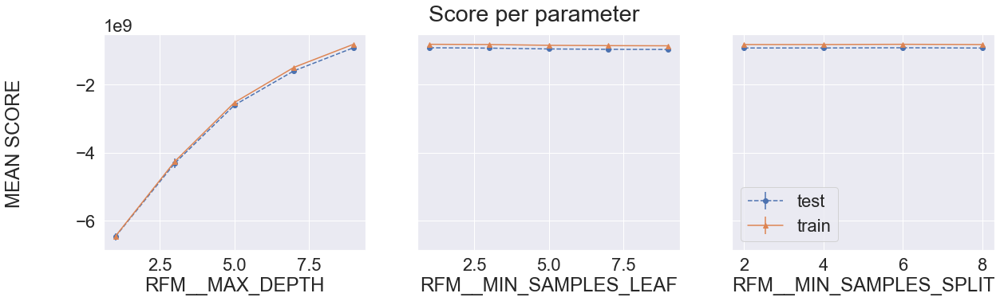

In [398]:
def plot_search_results(grid):
    """
    Params: 
        grid: A trained GridSearchCV object.
    """
    ## Results from grid search
    results = grid.cv_results_
    means_test = results['mean_test_score']
    stds_test = results['std_test_score']
    means_train = results['mean_train_score']
    stds_train = results['std_train_score']

    ## Getting indexes of values per hyper-parameter
    masks=[]
    masks_names= list(grid.best_params_.keys())
    for p_k, p_v in grid.best_params_.items():
        masks.append(list(results['param_'+p_k].data==p_v))              ##
    print(masks_names)
    

    params=grid.param_grid
    print(params)
    
   
    ## Ploting results
    fig, ax = plt.subplots(1,len(params),sharex='none', sharey='all',figsize=(20,5))
    fig.suptitle('Score per parameter')
    fig.text(0.04, 0.5, 'MEAN SCORE', va='center', rotation='vertical')
    
    pram_preformace_in_best = {}                         #{}
    
    for i, p in enumerate(masks_names):
        m = np.stack(masks[:i] + masks[i+1:])           ##
        pram_preformace_in_best
        best_parms_mask = m.all(axis=0)
        best_index = np.where(best_parms_mask)[0]
        #  best_index   [ 1  4  7 10 13 16 19 22]
        print(best_index)
        
        print(params[p])
        
        x = np.array(params[p])
        y_1 = np.array(means_test[best_index])
        e_1 = np.array(stds_test[best_index])
        y_2 = np.array(means_train[best_index])
        e_2 = np.array(stds_train[best_index])
        
        ax[i].errorbar(x, y_1, e_1, linestyle='--', marker='o', label='test')
        ax[i].errorbar(x, y_2, e_2, linestyle='-', marker='^',label='train' )
        
        ax[i].set_xlabel(p.upper())

    plt.legend()
    plt.show()

plot_search_results(grid_search)


In [399]:
# with tunned parameters


steps = [('rescale', StandardScaler()),
         ('rfm', RandomForestRegressor(max_depth=9, min_samples_leaf=1, min_samples_split=6))]
model = Pipeline(steps)
model = model.fit(X_train, y_train)

y_train_pred = model.predict(X_train)
y_test_pred = model.predict(X_test)

print('train RMSE: {0:.2e}'.format(np.sqrt(mean_squared_error(y_train, y_train_pred))))
print('train R2: {0:.3f}'.format(r2_score(y_train, y_train_pred)))

print('test RMSE: {0:.2e}'.format(np.sqrt(mean_squared_error(y_test, y_test_pred))))
print('test R2: {0:.3f}'.format(r2_score(y_test, y_test_pred)))


train RMSE: 2.92e+04
train R2: 0.901
test RMSE: 3.09e+04
test R2: 0.891


Text(0, 0.5, 'Test_predicted')

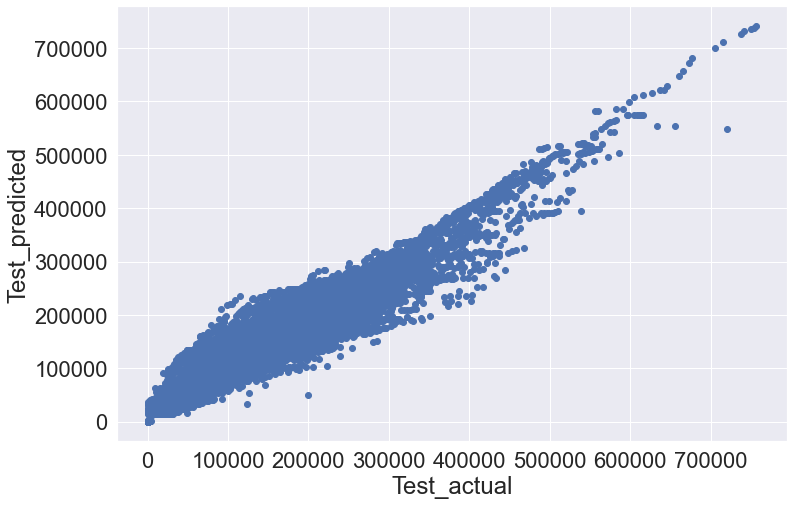

In [400]:
plt.scatter(y_test, y_test_pred)
plt.xlabel("Test_actual")
plt.ylabel("Test_predicted")

# 2. Solution 2, Gradient Boosting model

In [394]:
from sklearn.ensemble import GradientBoostingRegressor

steps = [('rescale', StandardScaler()),
         ('gbr', GradientBoostingRegressor())]
model_GB = Pipeline(steps)
model_GB = model.fit(X_train, y_train)

y_train_pred = model_GB.predict(X_train)
y_test_pred = model_GB.predict(X_test)

print('train RMSE: {0:.2e}'.format(np.sqrt(mean_squared_error(y_train, y_train_pred))))
print('train R2: {0:.3f}'.format(r2_score(y_train, y_train_pred)))

print('test RMSE: {0:.2e}'.format(np.sqrt(mean_squared_error(y_test, y_test_pred))))
print('test R2: {0:.3f}'.format(r2_score(y_test, y_test_pred)))


train RMSE: 2.99e+03
train R2: 0.999
test RMSE: 7.74e+03
test R2: 0.993


Feature ranking:
Feature novi_ip_day (0.406383)
Feature novi_bottom_hole_latitude (0.039259)
Feature novi_bottom_hole_longitude (0.044854)
Feature novi_heel_latitude (0.017630)
Feature novi_heel_longitude (0.024484)
Feature novi_lateral_length (0.038434)
Feature novi_net_thickness (0.024411)
Feature novi_permeability (0.015179)
Feature novi_porosity (0.009053)
Feature novi_spacing_azimuth (0.009004)
Feature novi_spacing_is_child (0.000281)
Feature novi_spacing_wells_in_radius (0.009077)
Feature novi_surface_hole_latitude (0.012846)
Feature novi_surface_hole_longitude (0.013660)
Feature novi_toc (0.020487)
Feature novi_toe_angle (0.013069)
Feature novi_tortuosity (0.016327)
Feature novi_total_fluid (0.081346)
Feature novi_total_proppant (0.114215)
Feature novi_tvd (0.017137)
Feature novi_vclay (0.041742)
Feature novi_region_0 (0.000123)
Feature novi_region_1 (0.000168)
Feature novi_formation_0 (0.000311)
Feature novi_formation_1 (0.000287)
Feature novi_current_operator_0 (0.000480)
Feat

C:\Users\Welcome\anaconda3\lib\site-packages\seaborn\_decorators.py:36: FutureWarning: Pass the following variables as keyword args: x, y. From version 0.12, the only valid positional argument will be `data`, and passing other arguments without an explicit keyword will result in an error or misinterpretation.
  warnings.warn(


0.9989669015969779

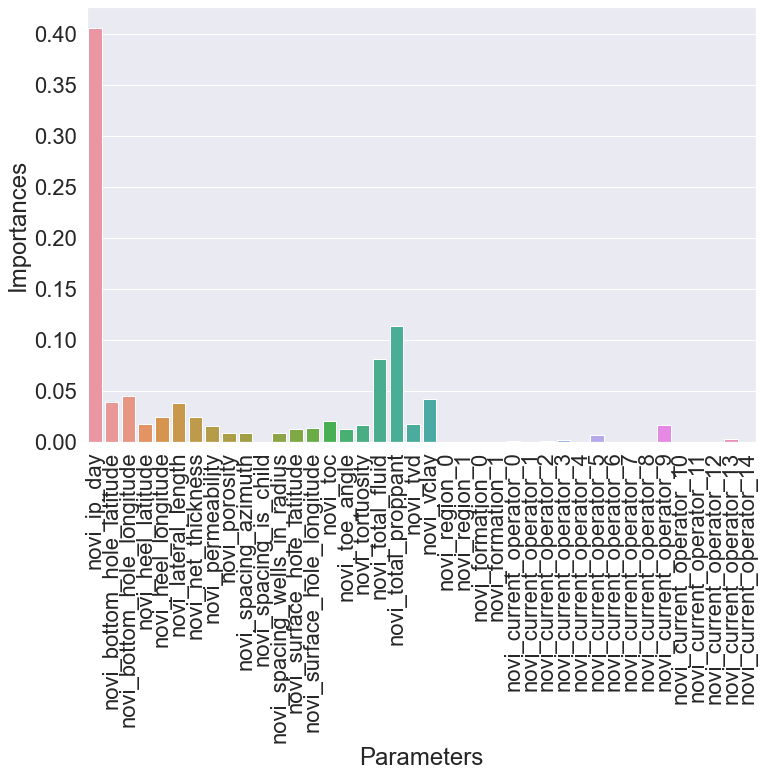

In [395]:
importances=model_GB.steps[1][1].feature_importances_

indices=list(X_train)
print("Feature ranking:")

for f in range(X_train.shape[1]):                                                   
    print("Feature %s (%f)" % (indices[f], importances[f]))    ###

sns.barplot(indices,importances)
plt.xlabel('Parameters')
plt.ylabel('Importances')
plt.xticks(rotation='90')
model.score(X_train,y_train)  

Text(0, 0.5, 'Test_predicted')

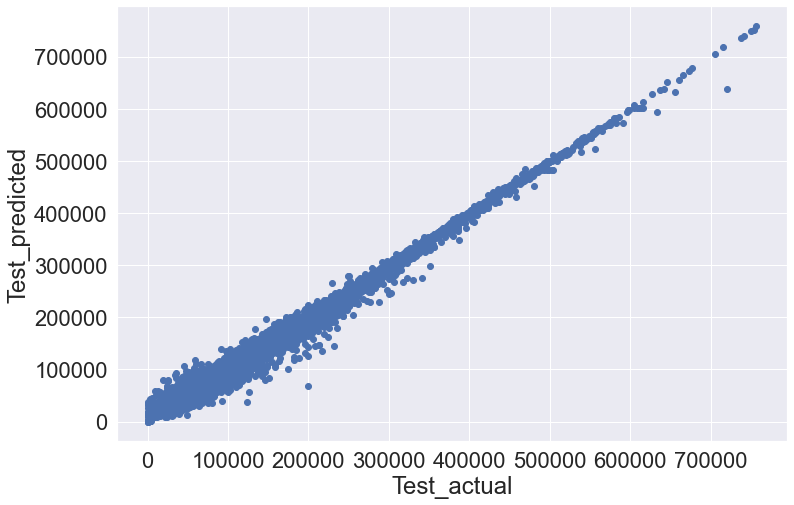

In [396]:
plt.scatter(y_test, y_test_pred)
plt.xlabel("Test_actual")
plt.ylabel("Test_predicted")

# 4. feature engineering

In [402]:
Features_final=Features_middle

In [403]:
Features_final['Reservor_Quality']=Features_final['novi_net_thickness']*Features_final['novi_permeability']*Features_final['novi_porosity']
Features_final['']=Features_final['novi_total_fluid']*Features_final['novi_total_proppant']/Features_final['novi_lateral_length']

In [404]:
from sklearn.model_selection import train_test_split

X=Features_final.loc[:,Features_final.columns!='novi_oil']   
y=Features_final['novi_oil']
X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.4, shuffle=True,random_state=42)

In [405]:
steps = [('rescale', StandardScaler()),
         ('rfm', RandomForestRegressor(oob_score=True))]
model = Pipeline(steps)
model = model.fit(X_train, y_train)

y_train_pred = model.predict(X_train)
y_test_pred = model.predict(X_test)

print('train RMSE: {0:.2e}'.format(np.sqrt(mean_squared_error(y_train, y_train_pred))))
print('train R2: {0:.3f}'.format(r2_score(y_train, y_train_pred)))

print('test RMSE: {0:.2e}'.format(np.sqrt(mean_squared_error(y_test, y_test_pred))))
print('test R2: {0:.3f}'.format(r2_score(y_test, y_test_pred)))

train RMSE: 3.01e+03
train R2: 0.999
test RMSE: 7.86e+03
test R2: 0.993


# Summary:
    (1) extenstive feature analysis and data modification have been conducted for the original data.
    (2) both random forest and gradient boosting model achive excellent regression results (R2 score 0.99)
    (3) grid search, fine tuning and feature engineering have been used to optimize the model performance.

In [413]:
from sklearn.preprocessing import MinMaxScaler
from sklearn.linear_model import LinearRegression
from sklearn.preprocessing import PolynomialFeatures

RMSE_train = []
RMSE_test = []
for degree in range(2, 4):
    steps_h = [('poly', PolynomialFeatures(degree = degree)),
               ('Rescale', StandardScaler()),
               ('lr', LinearRegression())]
    model_h = Pipeline(steps_h)
    model_h.fit(X_train, y_train)
    y_train_pred_h = model_h.predict(X_train)
    y_test_pred_h = model_h.predict(X_test)
    RMSE_train.append(np.sqrt(mean_squared_error(y_train, y_train_pred_h)))
    RMSE_test.append(np.sqrt(mean_squared_error(y_test, y_test_pred_h)))